In [1]:
import os
os.environ["OMP_NUM_THREADS"] = str(1)
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import scipy.stats as ss
import sys
sys.path.append('../../synthetic_data/')
import extended_model as em
import pickle

# Pharmacokinetic Parameters

In [2]:
# As reported in the Supplementary Information of 
# Panitchpakdi, M., Weldon, K. C., Jarmusch, A. K., Gentry, E. C., 
# Choi, A., Sepulveda, Y., ... & Tsunoda, S. M. (2021). 
# Non-Invasive Skin Sampling Detects Systemically Administered Drugs in Humans. 
# bioRxiv.

paper_values = {}
paper_values['191001'] = [2453.02,20.38,253  ,4  ,7.71,226.67]
paper_values['191002'] = [2003.28,24.96,252  ,1.5,8.04,289.48]
paper_values['191003'] = [1219.48,41   ,146  ,2  ,8.23,486.76]
paper_values['191004'] = [ 849.76,58.84, 85.9,2  ,8.19,695.49]
paper_values['191005'] = [1222.65,40.89,146  ,2  ,8.24,486.14]
paper_values['191007'] = [1647.45,30.35,252  ,2  ,7.38,323.24]
paper_values['191008'] = [1498.64,33.36,138  ,1.5,11  ,529.65]
paper_values['191009'] = [1234.67,40.5 ,141  ,2  ,8.13,475.22]
paper_values['191010'] = [ 610.15,81.95,59.9 ,2  ,9.17,1084.4]
paper_values['191011'] = [1007.84,49.61,102  ,2  ,8.77, 627.7]
paper_values = pd.DataFrame(paper_values).T
paper_values.columns = ['AUC_ng*h/mL','CL/f_L/h','Cmax_h','Tmax_h','HL_h','V/f_L']
paper_values

,AUC_ng*h/mL,CL/f_L/h,Cmax_h,Tmax_h,HL_h,V/f_L
191001,2453.02,20.38,253.0,4.0,7.71,226.67
191002,2003.28,24.96,252.0,1.5,8.04,289.48
191003,1219.48,41.00,146.0,2.0,8.23,486.76
191004,849.76,58.84,85.9,2.0,8.19,695.49
191005,1222.65,40.89,146.0,2.0,8.24,486.14
191007,1647.45,30.35,252.0,2.0,7.38,323.24
191008,1498.64,33.36,138.0,1.5,11.00,529.65
191009,1234.67,40.50,141.0,2.0,8.13,475.22
191010,610.15,81.95,59.9,2.0,9.17,1084.40
191011,1007.84,49.61,102.0,2.0,8.77,627.70


# Calibration Curve

In [3]:
raw = pd.read_csv('combined_raw_data.csv',low_memory=False,index_col=0)
calibration = raw[raw['sample_type']=='calibration']

In [4]:
# get values of AUC and C of the calibration curve
peak_values = []
conc_values = []
for idx in calibration.index:
    # feature_439 is Diphenhydramine as identified by the reported RT and MZ
    if calibration.loc[idx,'feature_439'] == 0:
        # this excludes measurements under the limit of detection
        pass
    else:
        if idx.split()[0].split('_')[2].strip('ngmL').isnumeric():
            conc_values.append(float(idx.split()[0].split('_')[2].strip('ngmL')))
            peak_values.append(calibration.loc[idx,'feature_439'])
        else:
            pass
peak_values = np.array(peak_values)
conc_values = np.array(conc_values)

In [5]:
def lin(x,k,d):
    y = k*x+d
    return y

p,var = curve_fit(f = lin,
              xdata = peak_values,
              ydata = conc_values,
              sigma = peak_values)
print('C = {:.2e} * AUC + {:.2e}'.format(*p))

C = 3.47e-06 * AUC + 4.16e-01


In [6]:
# i. e. 
p_cal = p
p_cal = np.array([3.47116988e-06, 4.16443143e-01])

# Functions

In [7]:
def calculate_pqn(m_tensor):
    '''
    Calculate normalization factor according to PQN as described by Filzmoser et al., 2014.
    -
    Input:
    m_tensor     Numpy array of shape (n_metabolites * n_timepoints) of measured data.
    -
    Output:
    pqn          Numpy array of shape (n_timepoints) with normalization factors.
    '''
    
    # implemented according to http://dx.doi.org/10.1016/j.chroma.2014.08.050
    ref = np.median(m_tensor,axis=1) 
    div = np.divide(m_tensor,ref[:,None])
    pqn = np.median(div,axis=0)
    return pqn

In [8]:
def plot(model,tmp,title,factor_dic):
    fig = plt.figure(dpi=200,figsize=(9,6))
    lns = []
    spec = fig.add_gridspec(4, 2)
    syn_x = np.linspace(0,24,1000)
    #####
    ## V
    ####
    ax1 = fig.add_subplot(spec[0, :])
    ax1.set_title(title)
    tmpl = plt.bar(model.time,model.get_sweat_volumes(),width=.3,color='grey',edgecolor='k',label=r'$V_{\rm sweat}$')
    lns.append(tmpl)
    if type(model) == em.MIX_model:
        if model.scale_fun_name == 'standard':
            trans_pqn = model.measured_data[model.n_timepoints*model.n_metabolites:]
            trans_sv = model.trans_fun(model.get_sweat_volumes())
            original_sv = trans_pqn*np.std(trans_sv)+np.mean(trans_sv)
            tmpl = plt.scatter(model.time,10**original_sv,zorder=10,color='r',marker='x',label=r'$Z(\rm log~Q^{\rm PQN})\rm ~Std(V_{\rm sweat})+\bar{V}_{\rm sweat}$')
            lns.append(tmpl)
        elif model.scale_fun == 'mean':
            print('NOT IMPLEMENTED')
        else:
            print('NOT IMPLEMENTED')
            
    plt.setp(ax1.get_xticklabels(), visible=False)
    plt.ylabel('V in mL')
    #####
    ## C
    ####
    ax2 = fig.add_subplot(spec[1:, :],sharex=ax1)
    ax3 = plt.twinx(ax2)
    metabolites = ['DPH_ng/mL','NDM-DPH','DPH-N-glucuronide','DPH-N-glucose']
    colors = ['b','k','r','y']
    C_tensor = model.get_C_tensor(syn_x)
    
    
    for n, metabolite in enumerate(metabolites):
        if n == model.n_metabolites:
            break
        if n == 0:
            tmpax = ax2
        else:
            tmpax = ax3
        tmpax.plot(syn_x,C_tensor[n]*factor_dic[metabolite],color=colors[n])
        tmpl = tmpax.scatter(model.time,tmp[metabolite]/model.get_sweat_volumes()*factor_dic[metabolite],label=metabolite,color=colors[n])
        lns.append(tmpl)
    labs = [l.get_label() for l in lns]
    ax2.legend(lns, labs)
    ax2.set_xlabel('time in h')
    ax2.set_ylabel(r'$C$ in ng/mL')
    ax3.set_ylabel(r'$C$ in AUC')
    plt.tight_layout()
    plt.show()
    return


# Sub_2 Models

## Run Fits

100%|██████████| 100/100 [00:00<00:00, 447.33it/s]


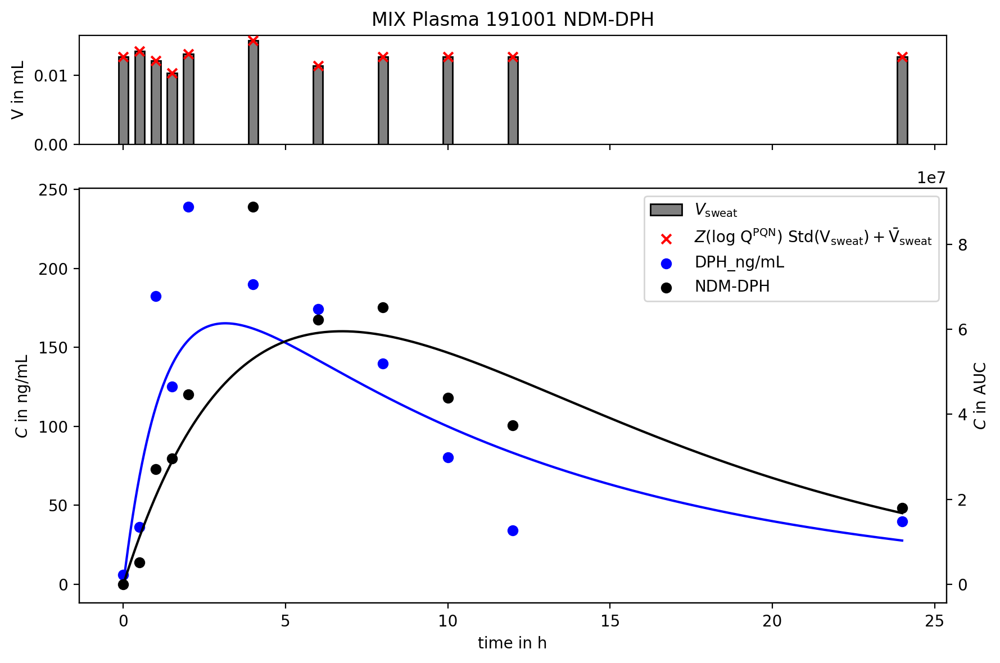

100%|██████████| 100/100 [00:00<00:00, 603.87it/s]


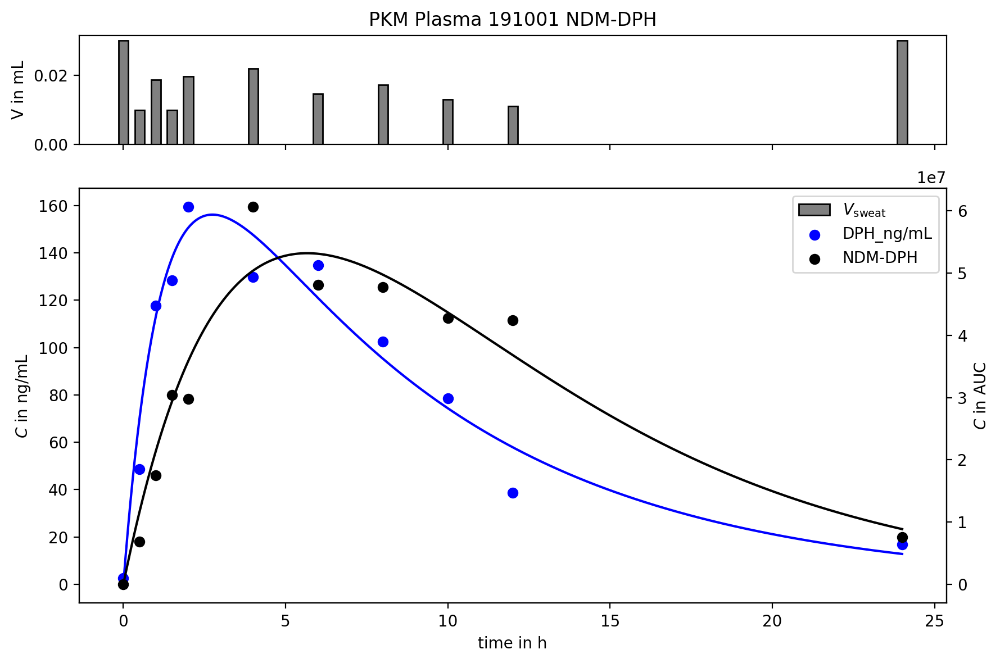

100%|██████████| 100/100 [00:00<00:00, 380.28it/s]


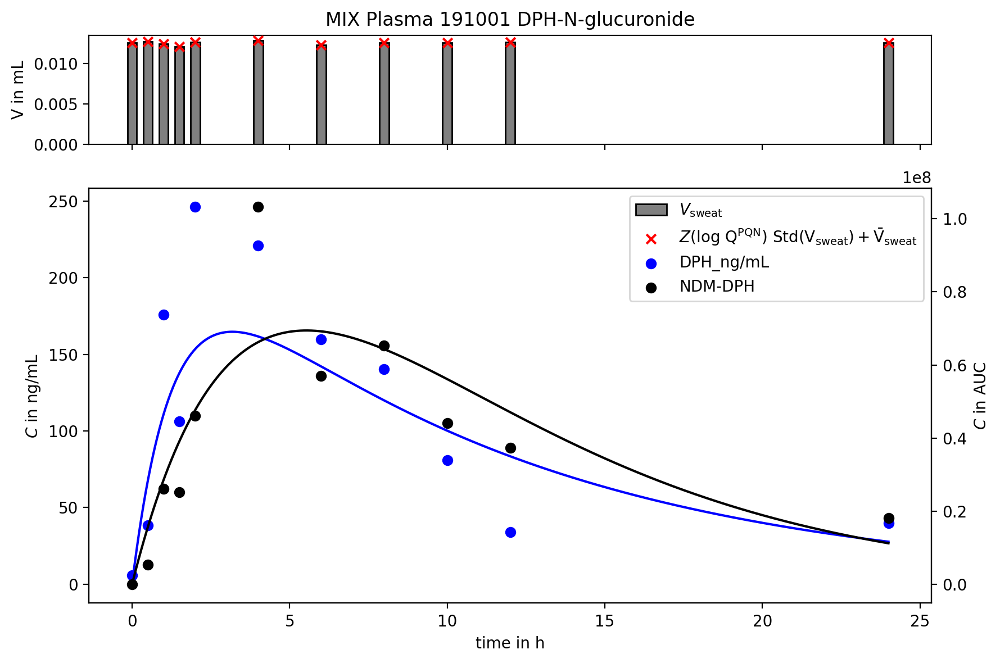

100%|██████████| 100/100 [00:00<00:00, 688.83it/s]


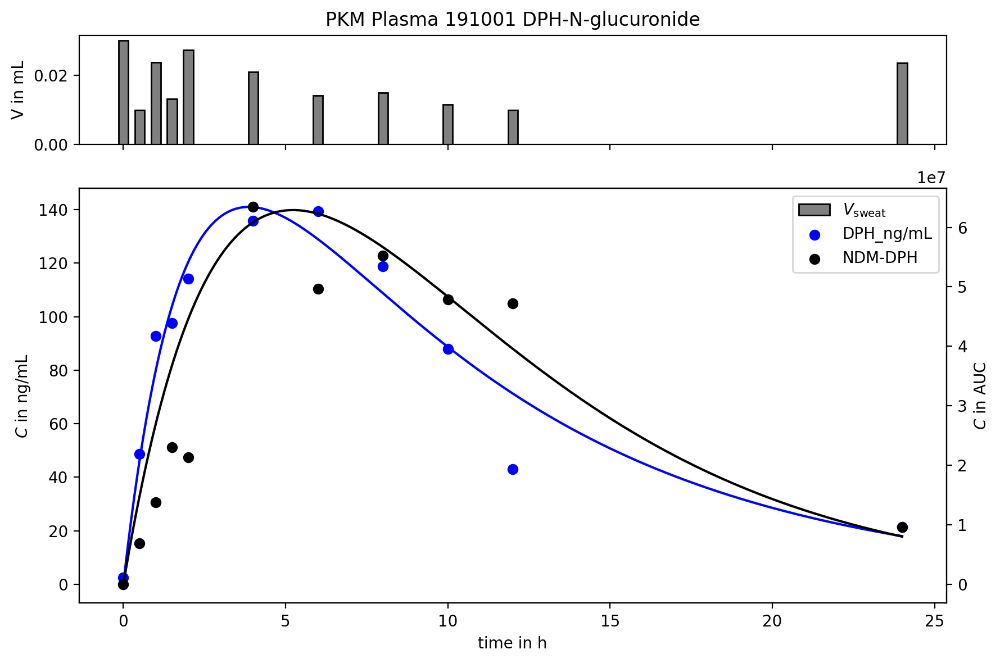

100%|██████████| 100/100 [00:00<00:00, 393.87it/s]


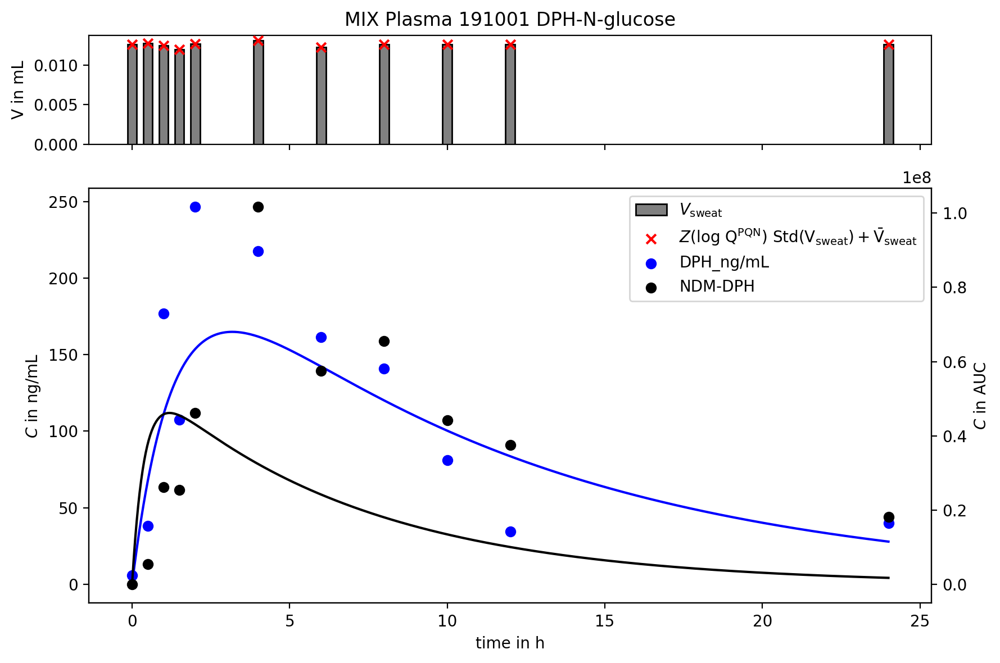

100%|██████████| 100/100 [00:00<00:00, 759.24it/s]


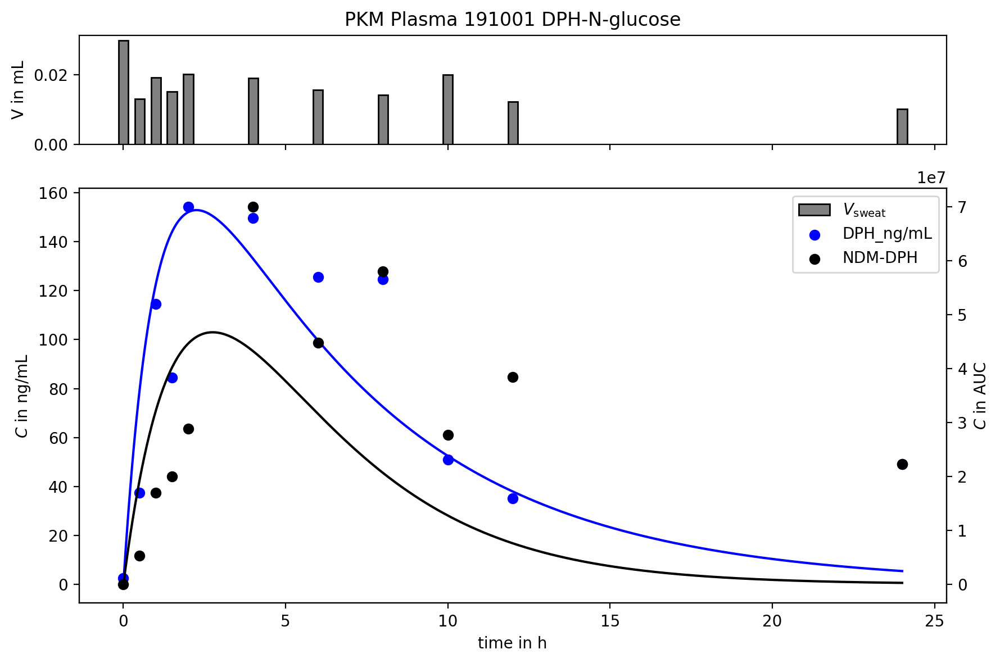

100%|██████████| 100/100 [00:00<00:00, 539.56it/s]


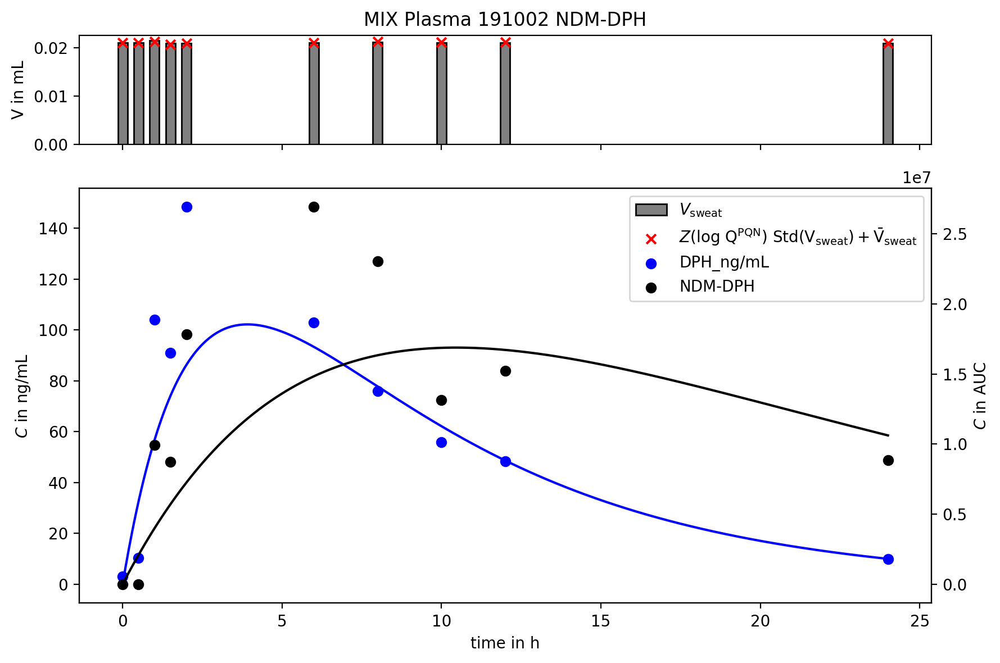

100%|██████████| 100/100 [00:00<00:00, 922.29it/s]


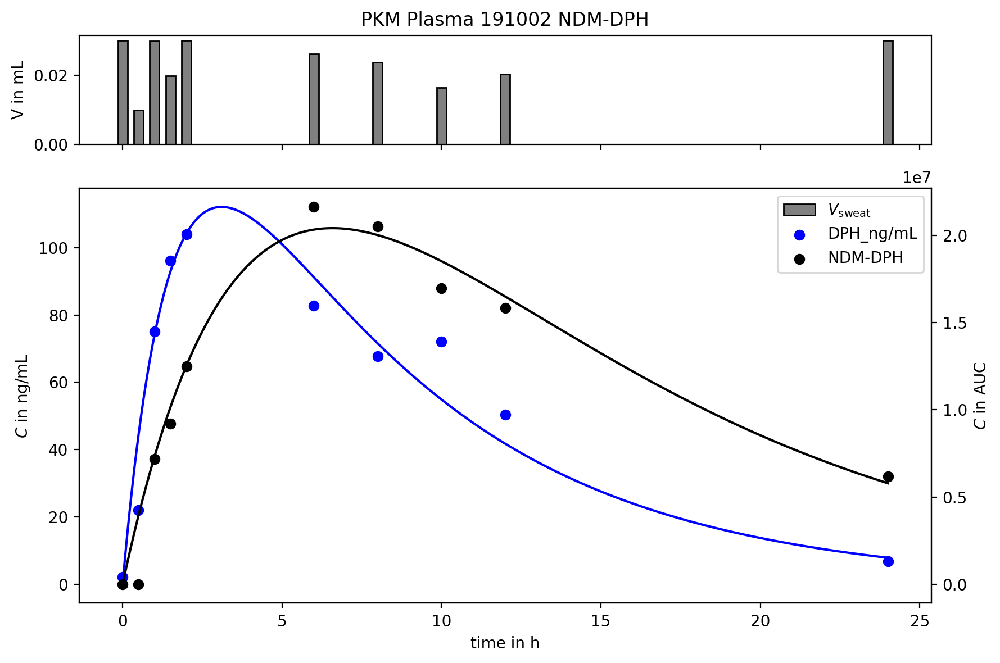

100%|██████████| 100/100 [00:00<00:00, 441.96it/s]


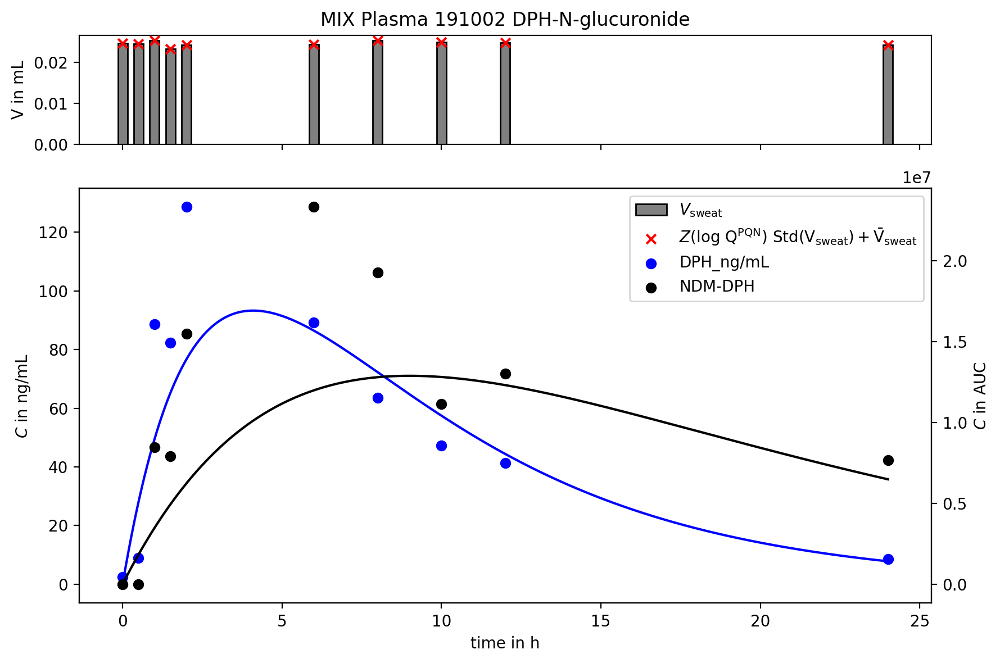

100%|██████████| 100/100 [00:00<00:00, 797.30it/s]


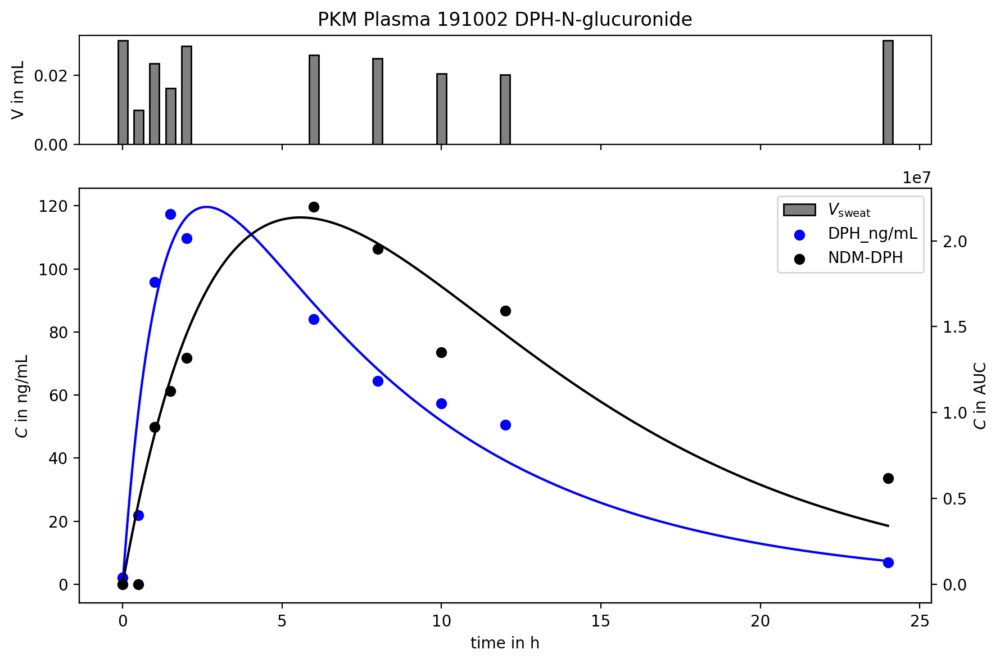

100%|██████████| 100/100 [00:00<00:00, 576.17it/s]


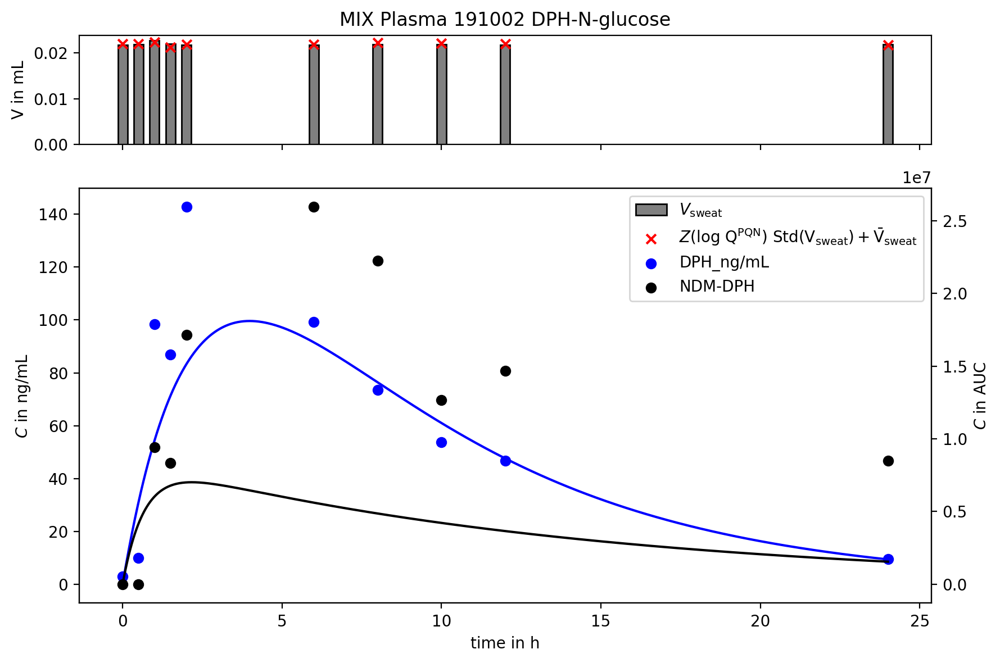

100%|██████████| 100/100 [00:00<00:00, 893.01it/s]


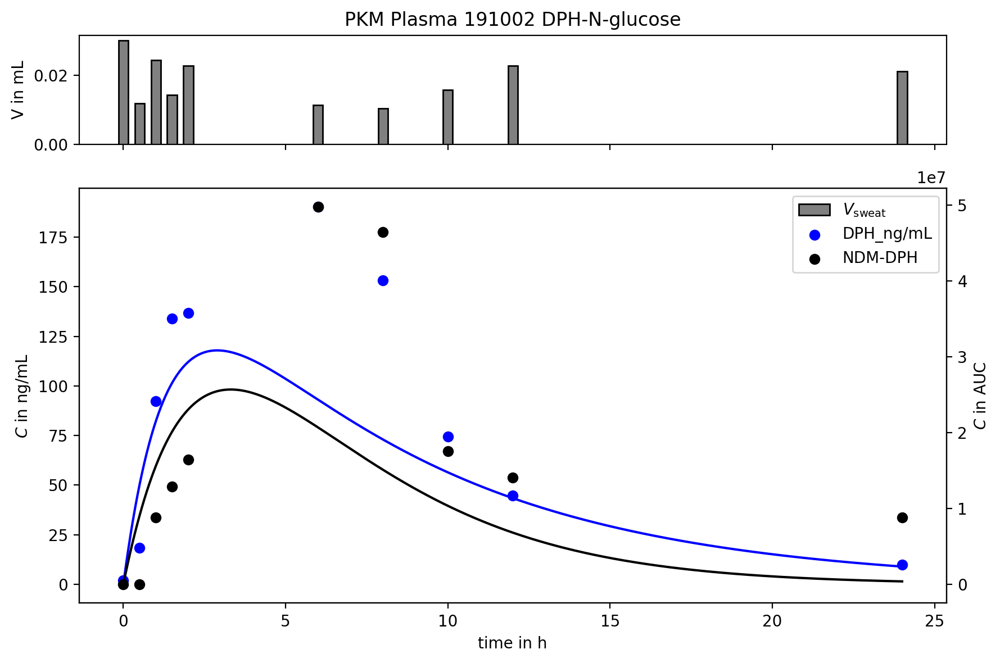

100%|██████████| 100/100 [00:00<00:00, 476.12it/s]


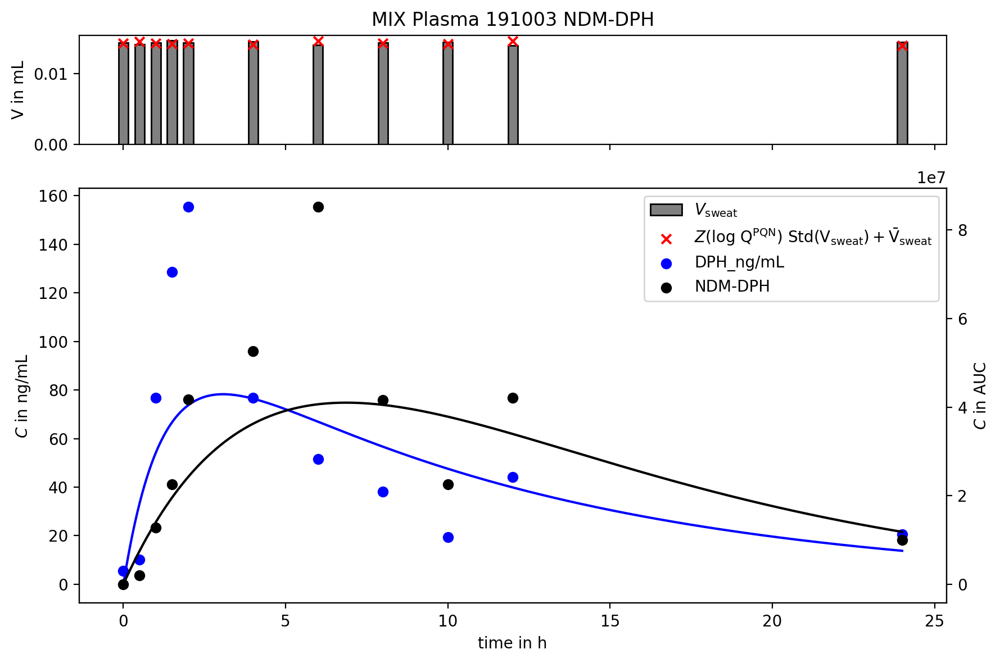

100%|██████████| 100/100 [00:00<00:00, 904.72it/s]


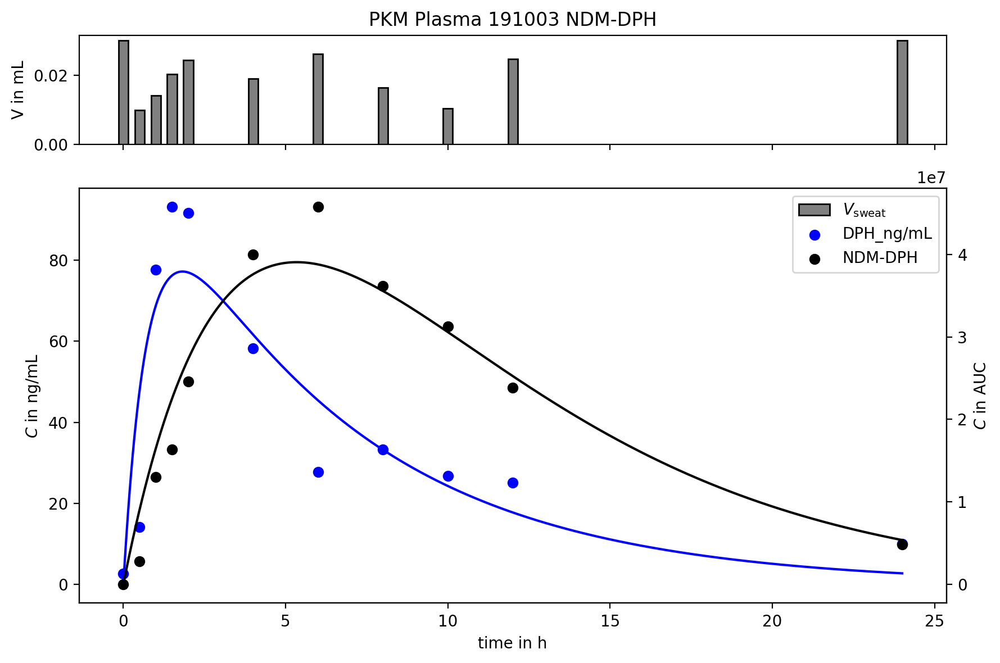

100%|██████████| 100/100 [00:00<00:00, 530.30it/s]


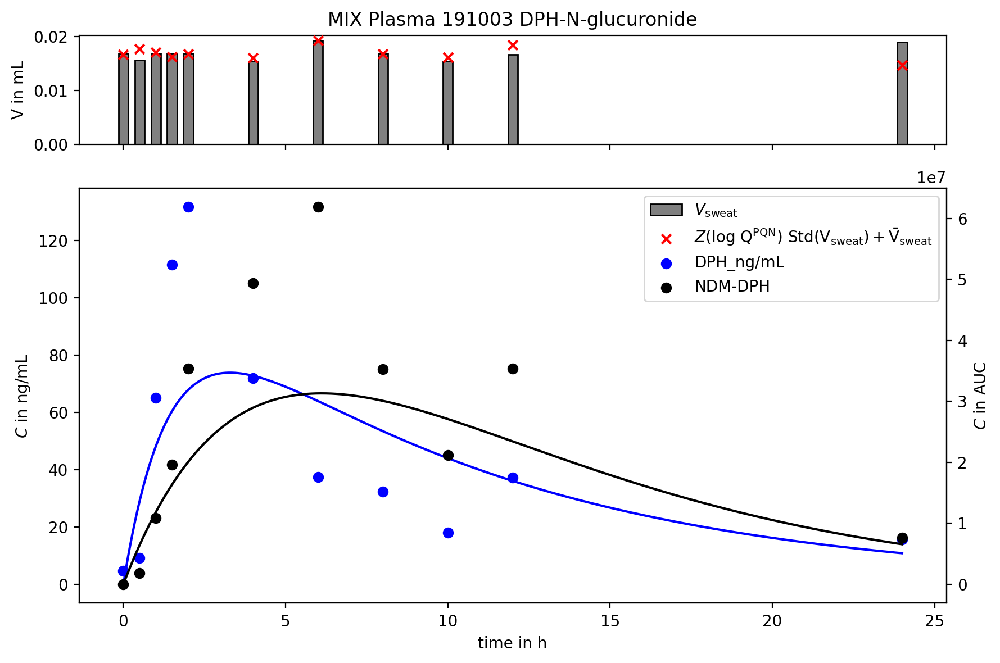

100%|██████████| 100/100 [00:00<00:00, 926.13it/s]


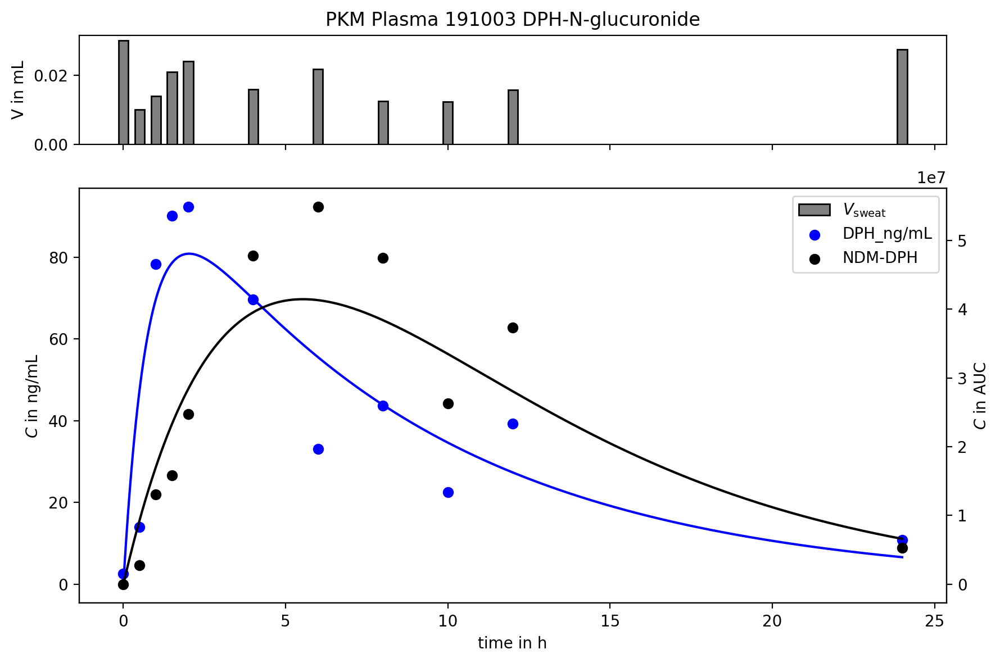

100%|██████████| 100/100 [00:01<00:00, 79.76it/s]


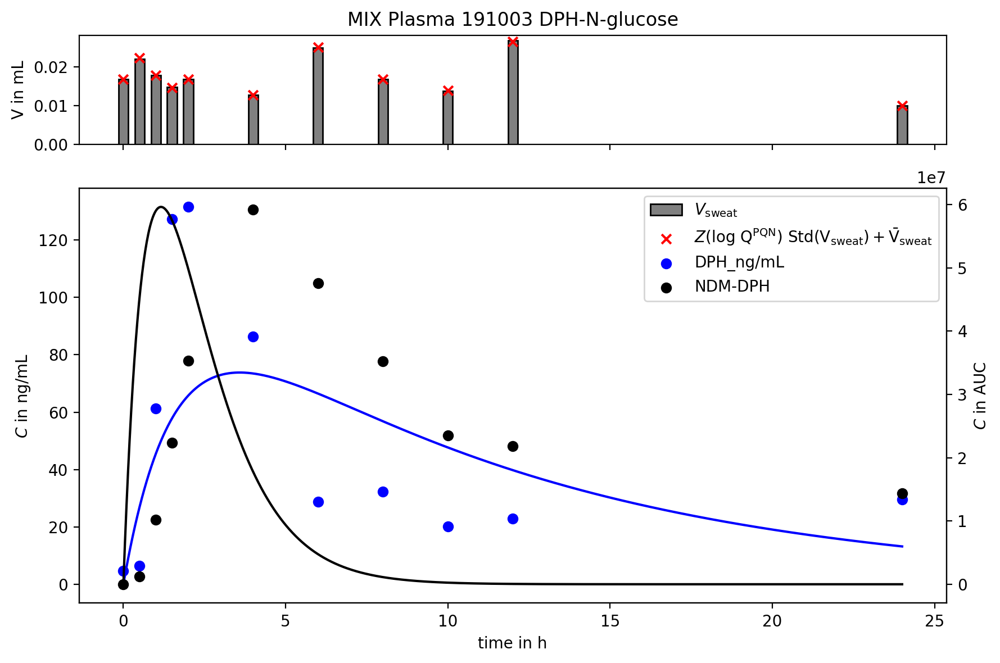

100%|██████████| 100/100 [00:00<00:00, 759.32it/s]


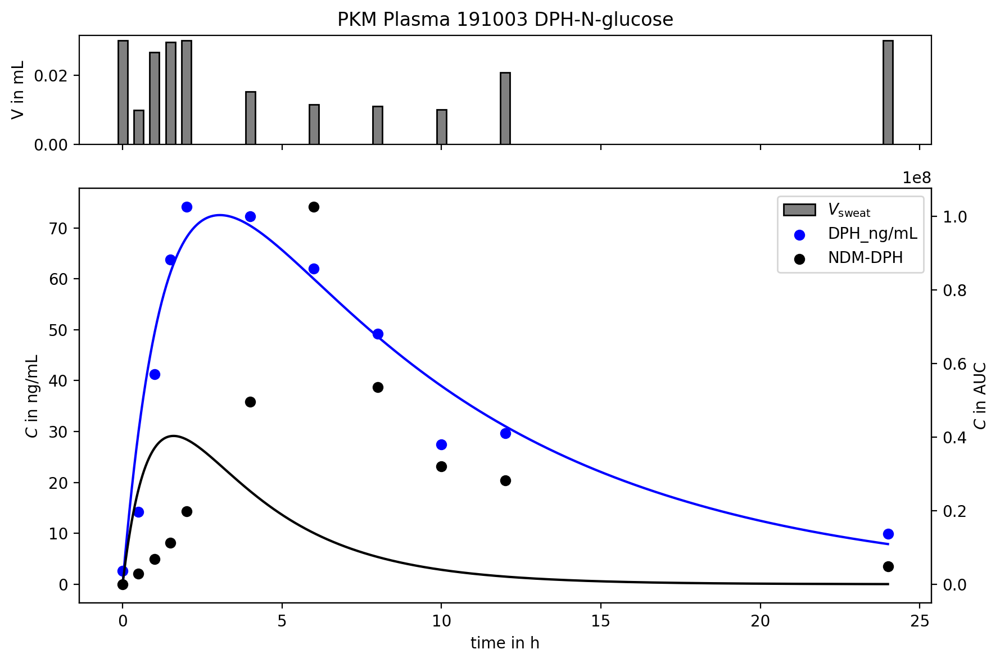

100%|██████████| 100/100 [00:00<00:00, 678.25it/s]


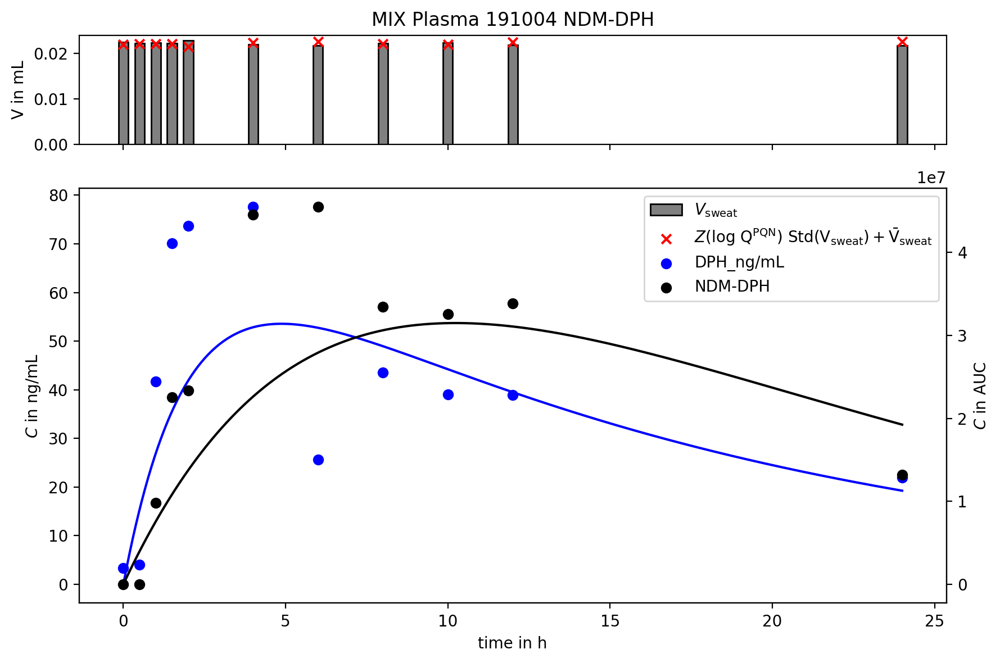

100%|██████████| 100/100 [00:00<00:00, 689.84it/s]


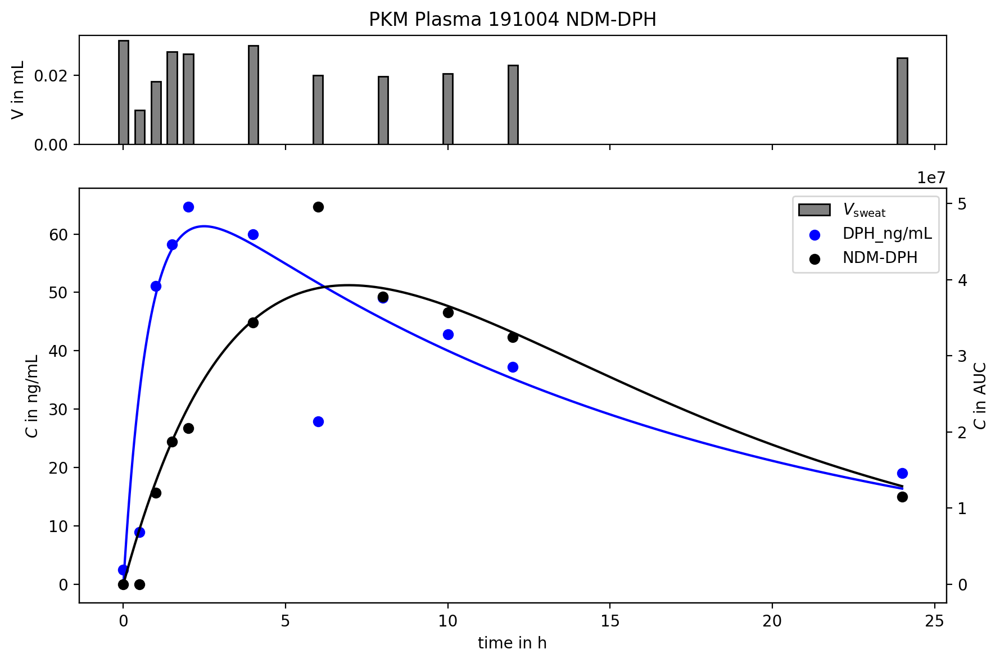

100%|██████████| 100/100 [00:00<00:00, 491.82it/s]


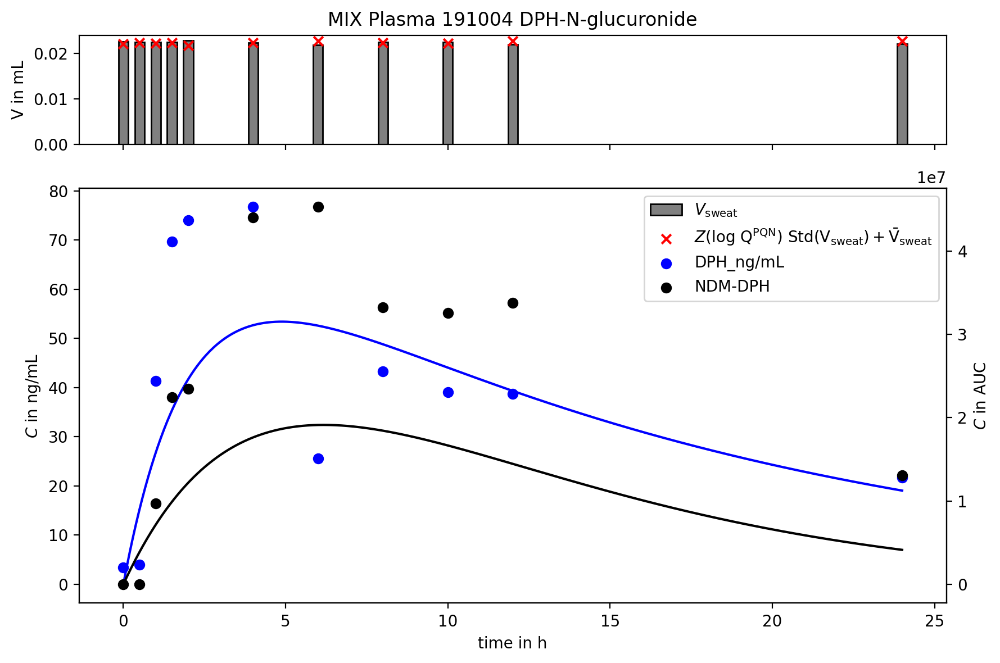

100%|██████████| 100/100 [00:00<00:00, 664.52it/s]


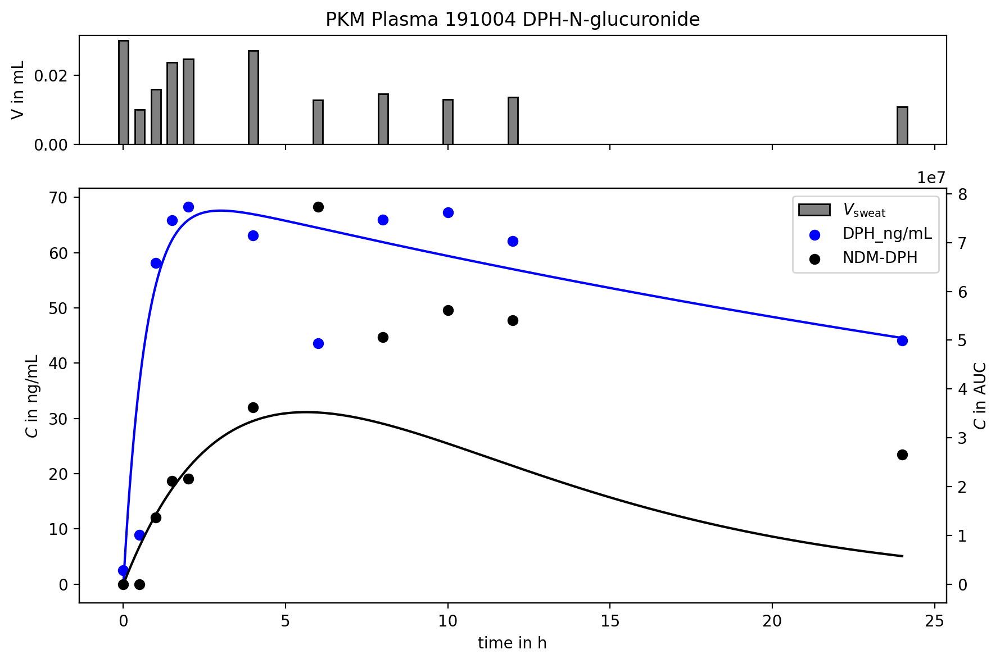

100%|██████████| 100/100 [00:00<00:00, 536.82it/s]


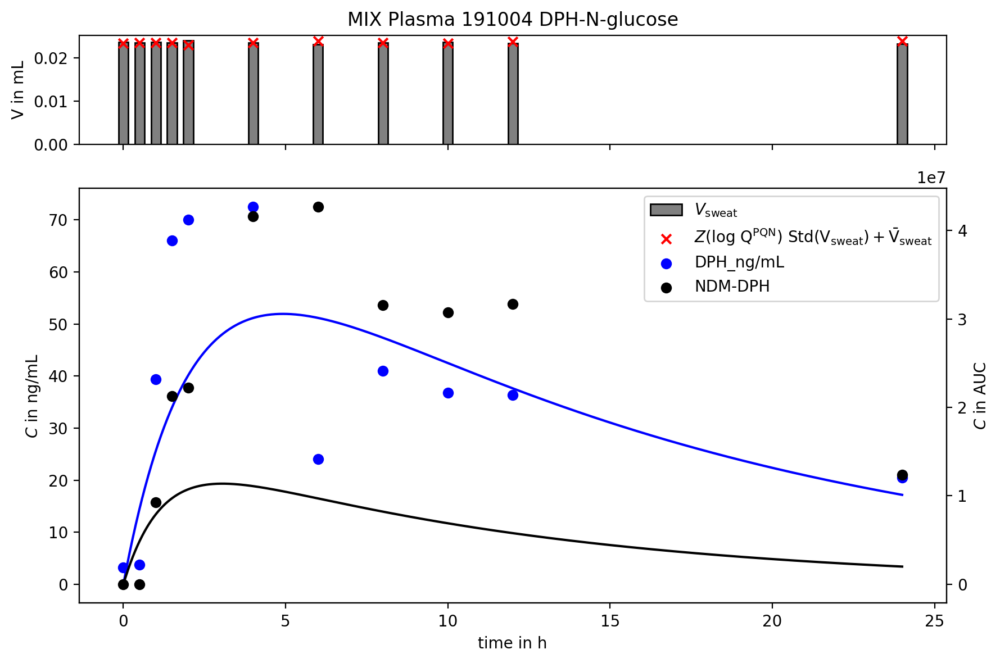

100%|██████████| 100/100 [00:00<00:00, 728.14it/s]


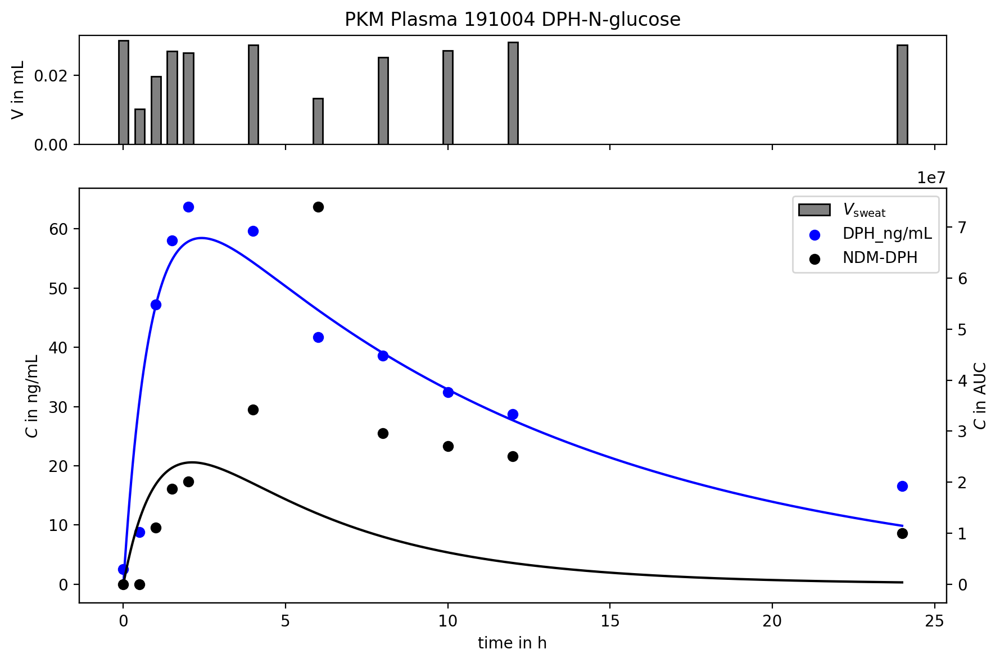

100%|██████████| 100/100 [00:00<00:00, 294.52it/s]


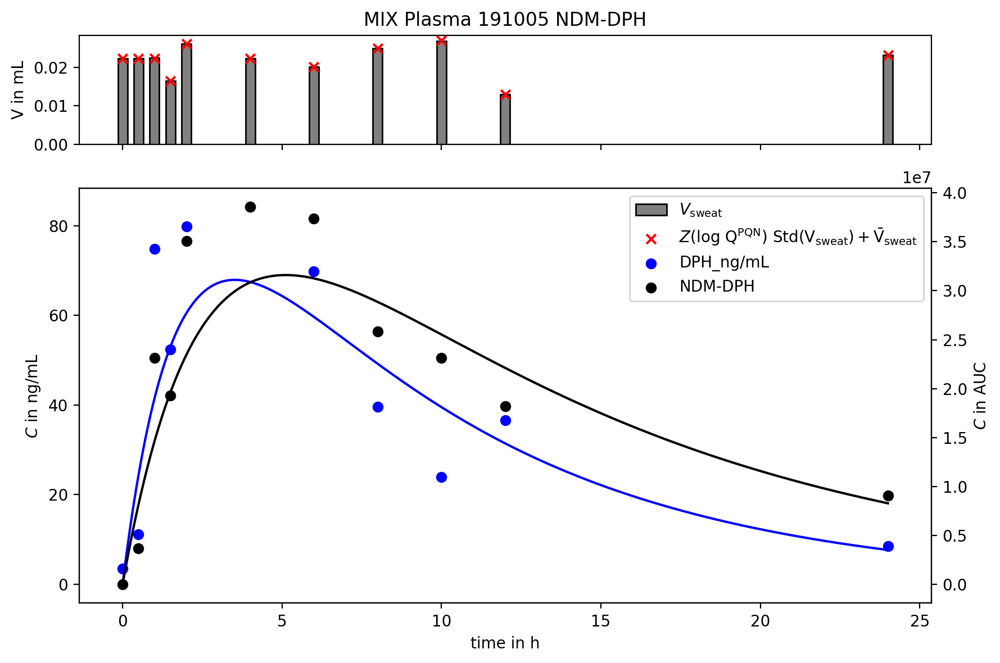

100%|██████████| 100/100 [00:00<00:00, 677.02it/s]


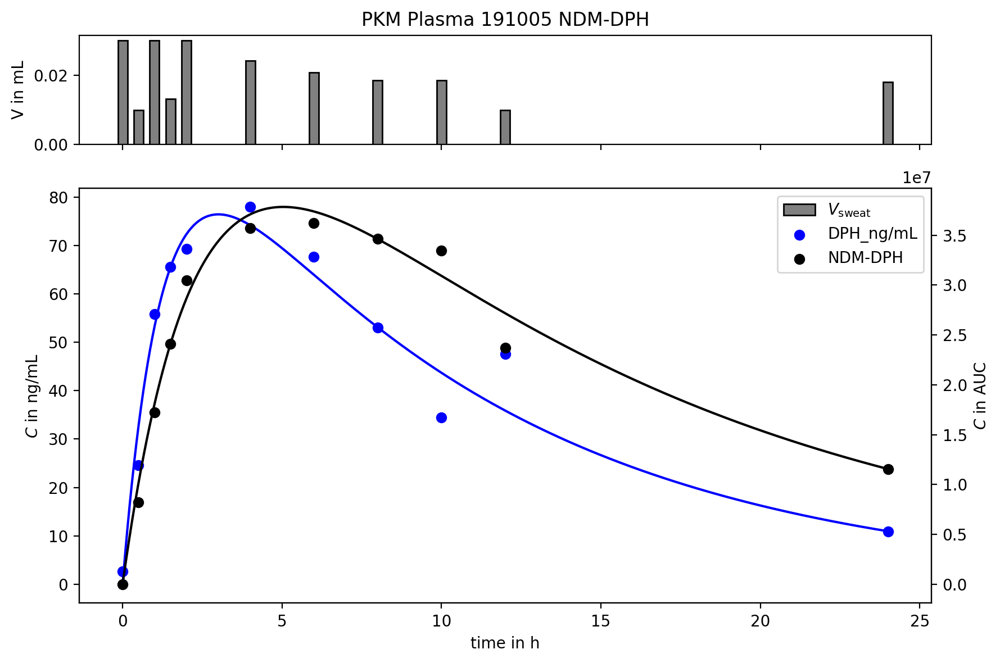

100%|██████████| 100/100 [00:00<00:00, 708.45it/s]


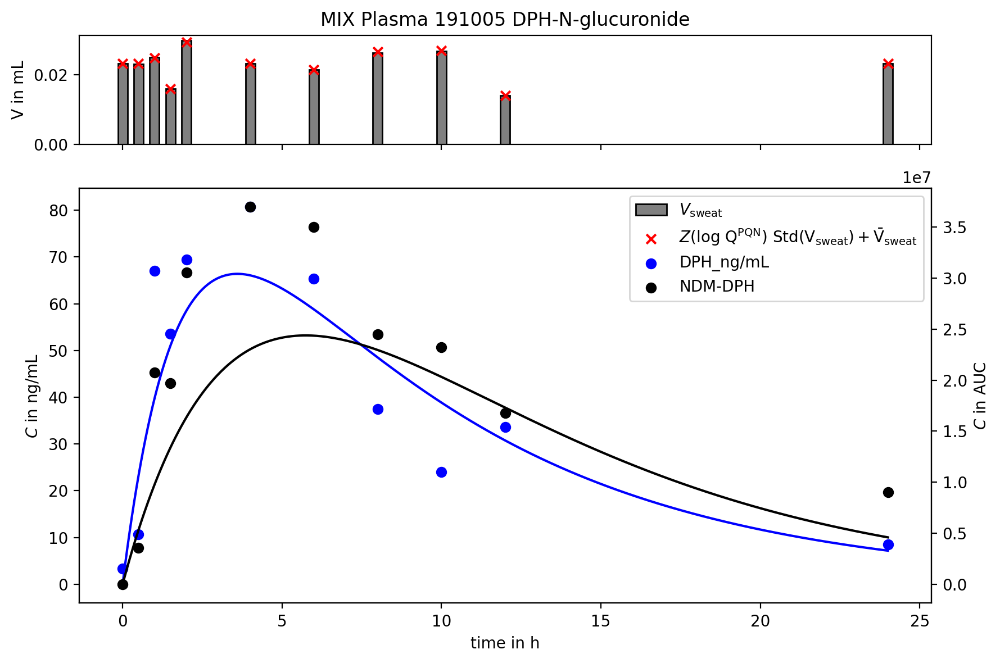

100%|██████████| 100/100 [00:00<00:00, 779.05it/s]


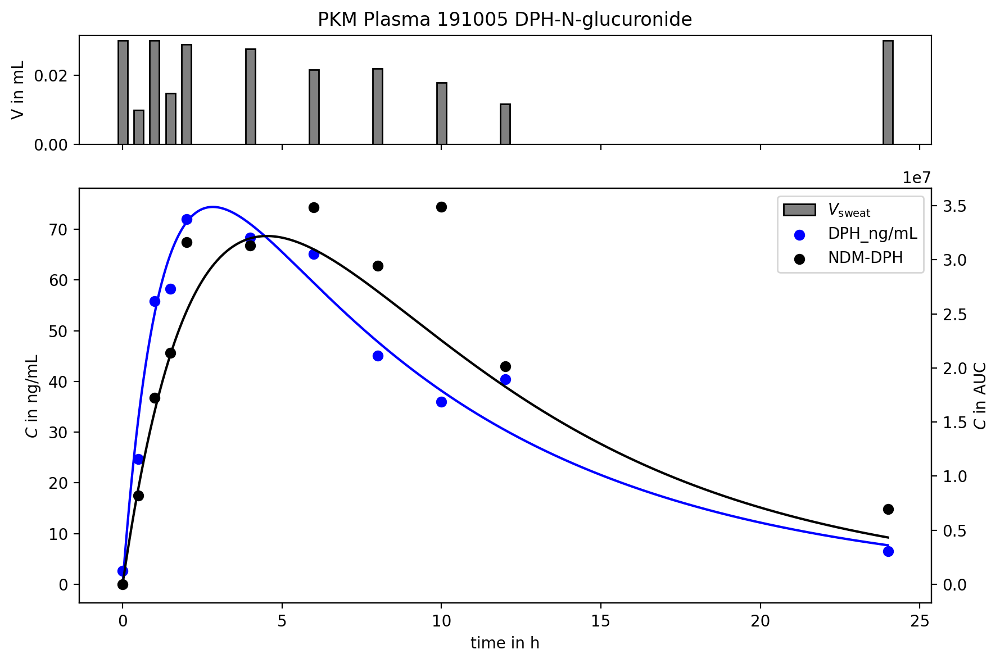

100%|██████████| 100/100 [00:00<00:00, 410.15it/s]


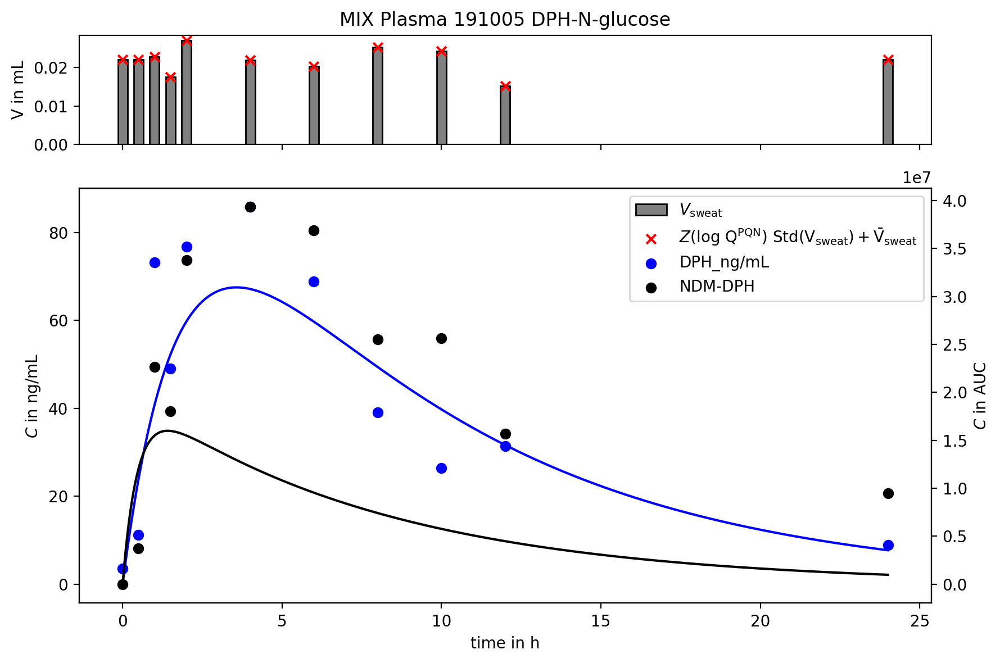

100%|██████████| 100/100 [00:00<00:00, 1047.70it/s]


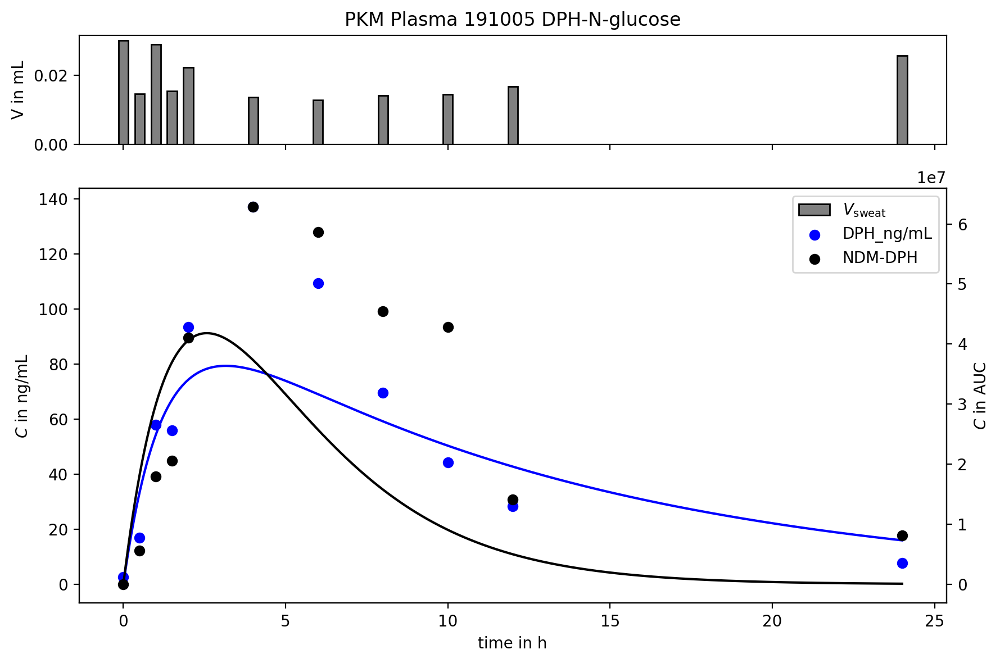

100%|██████████| 100/100 [00:00<00:00, 507.80it/s]


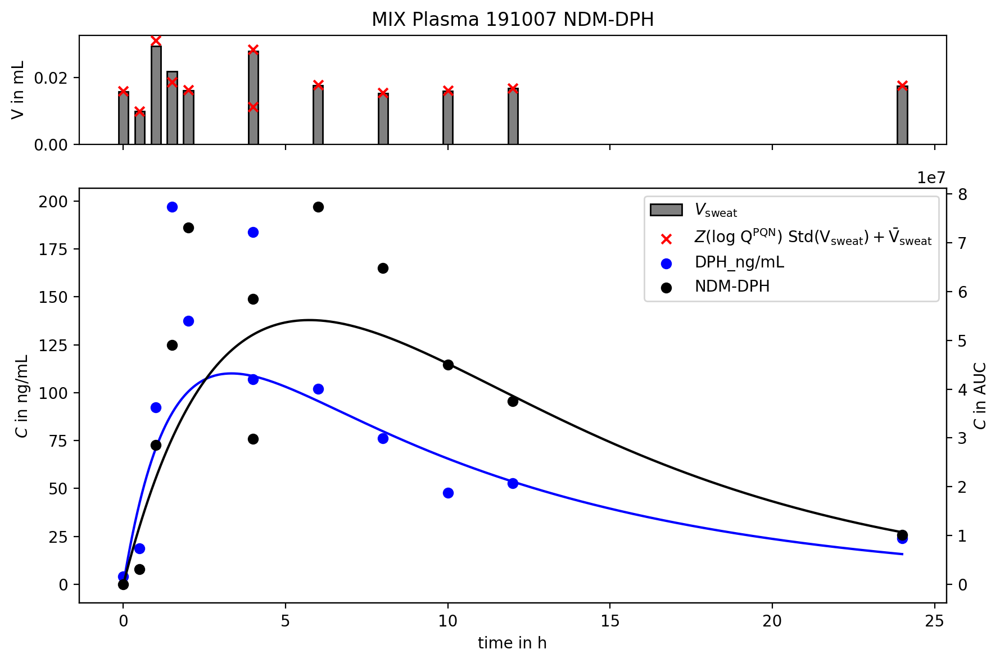

100%|██████████| 100/100 [00:00<00:00, 563.29it/s]


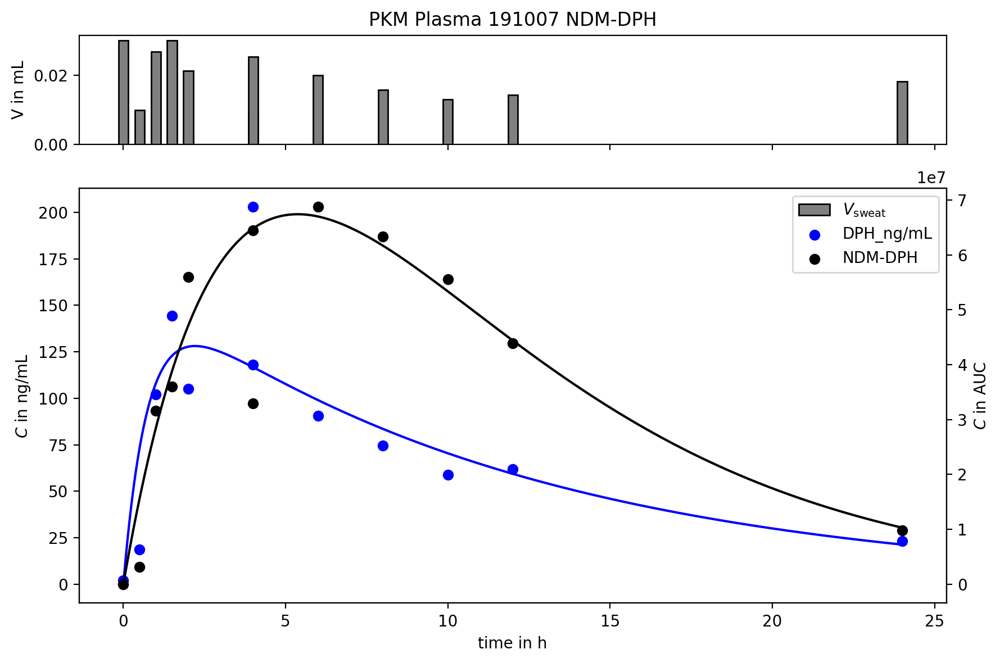

100%|██████████| 100/100 [00:00<00:00, 437.81it/s]


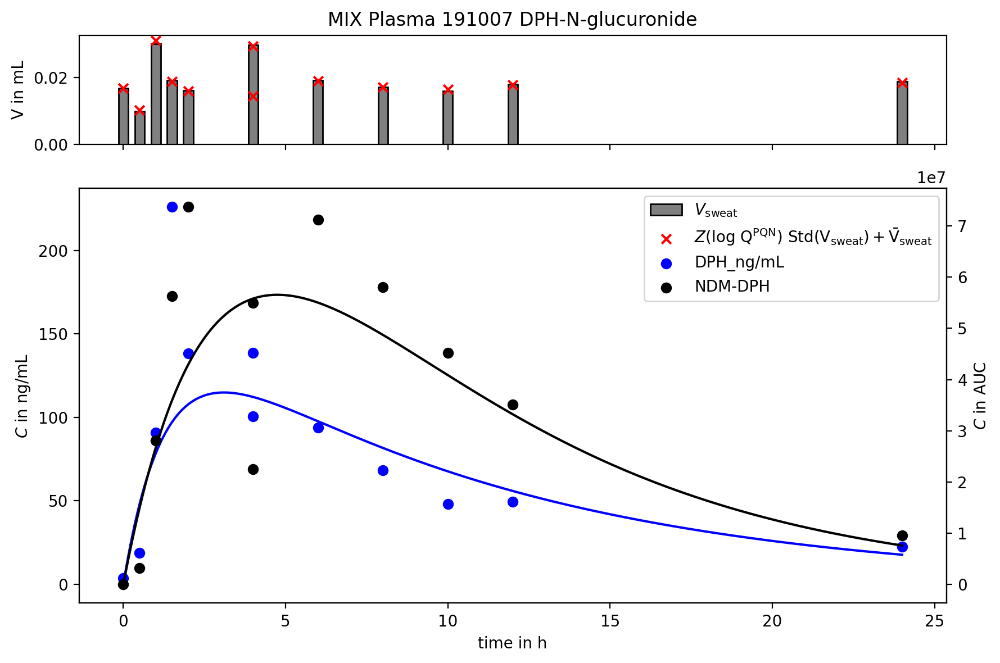

100%|██████████| 100/100 [00:00<00:00, 757.57it/s]


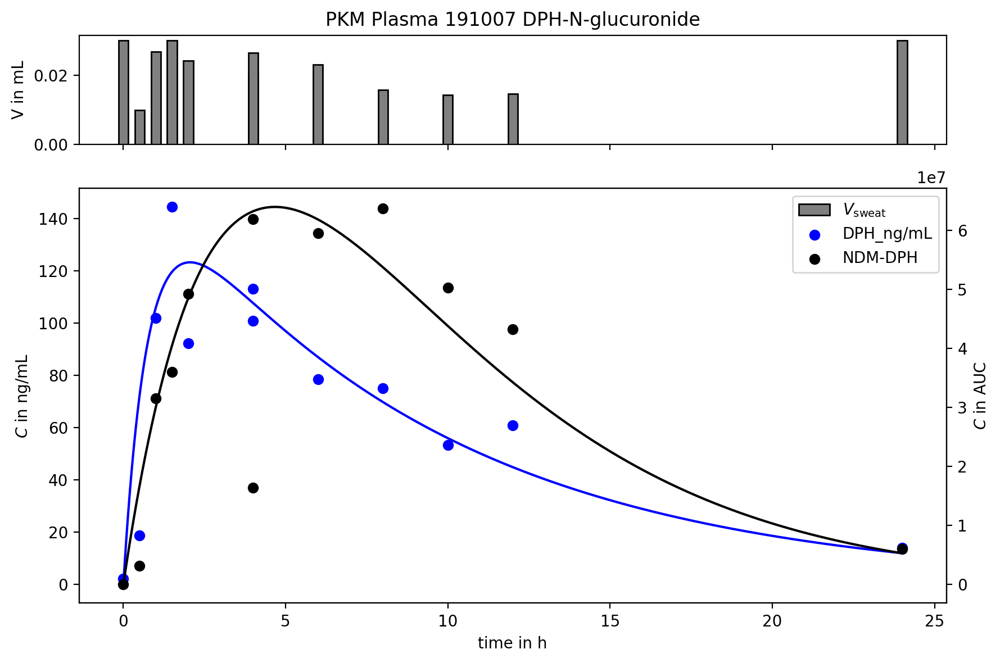

100%|██████████| 100/100 [00:00<00:00, 446.51it/s]


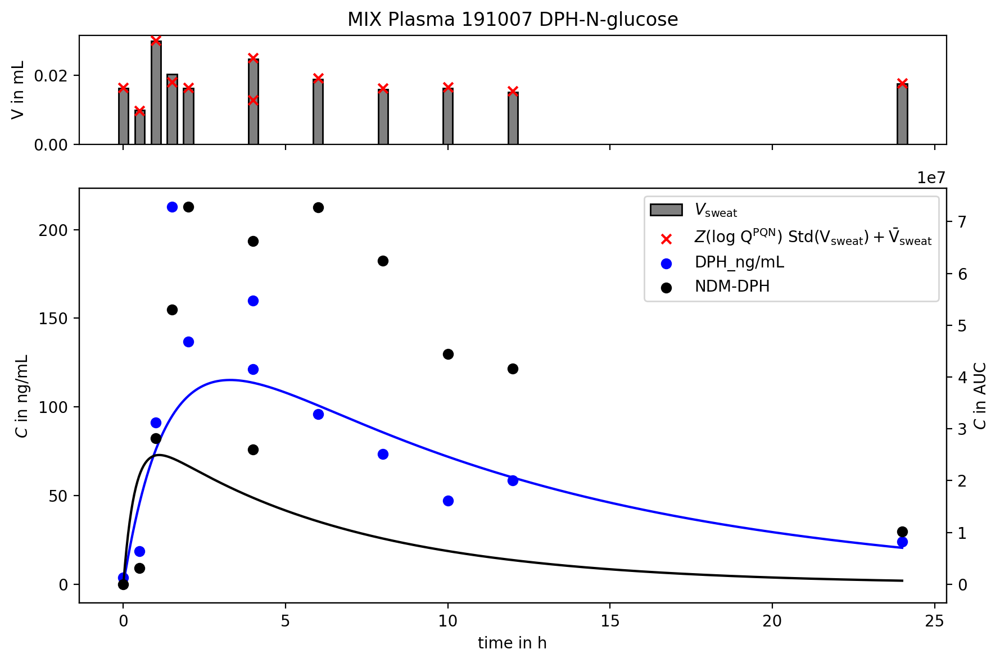

100%|██████████| 100/100 [00:00<00:00, 479.55it/s]


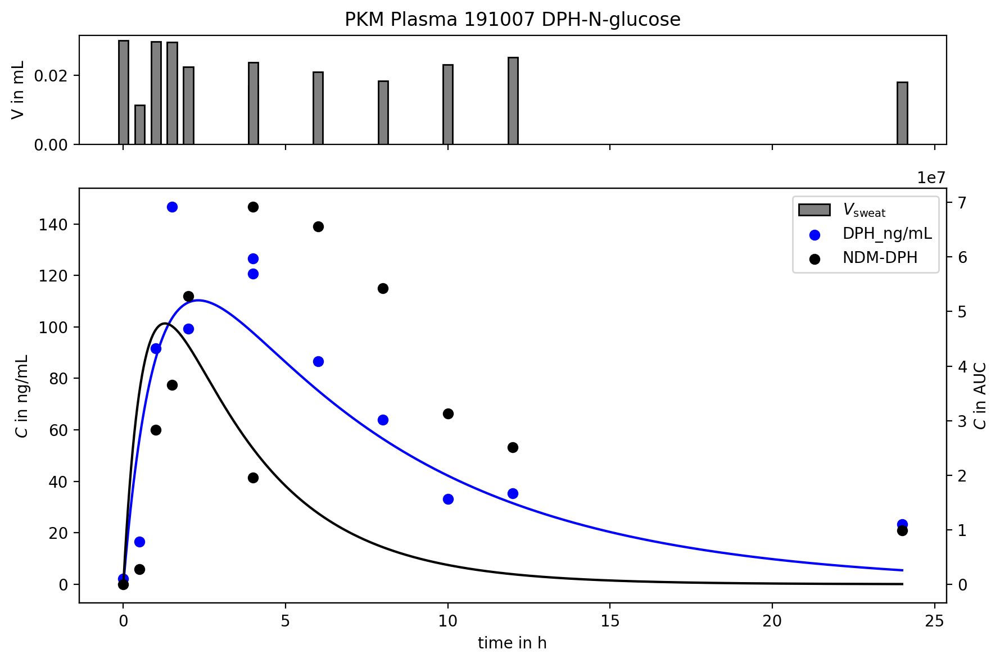

100%|██████████| 100/100 [00:00<00:00, 509.09it/s]


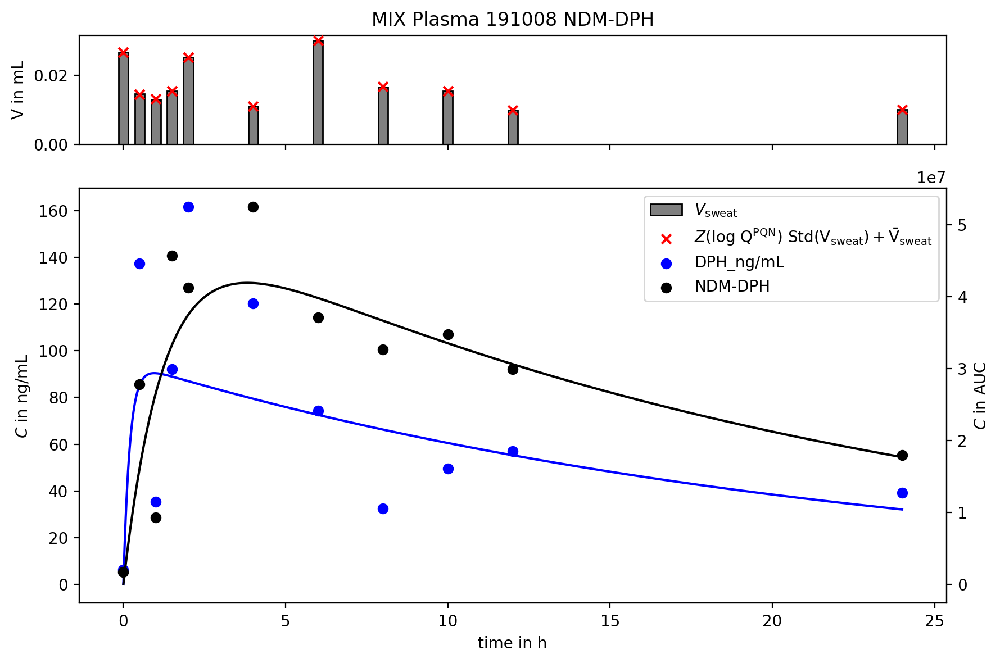

100%|██████████| 100/100 [00:00<00:00, 533.38it/s]


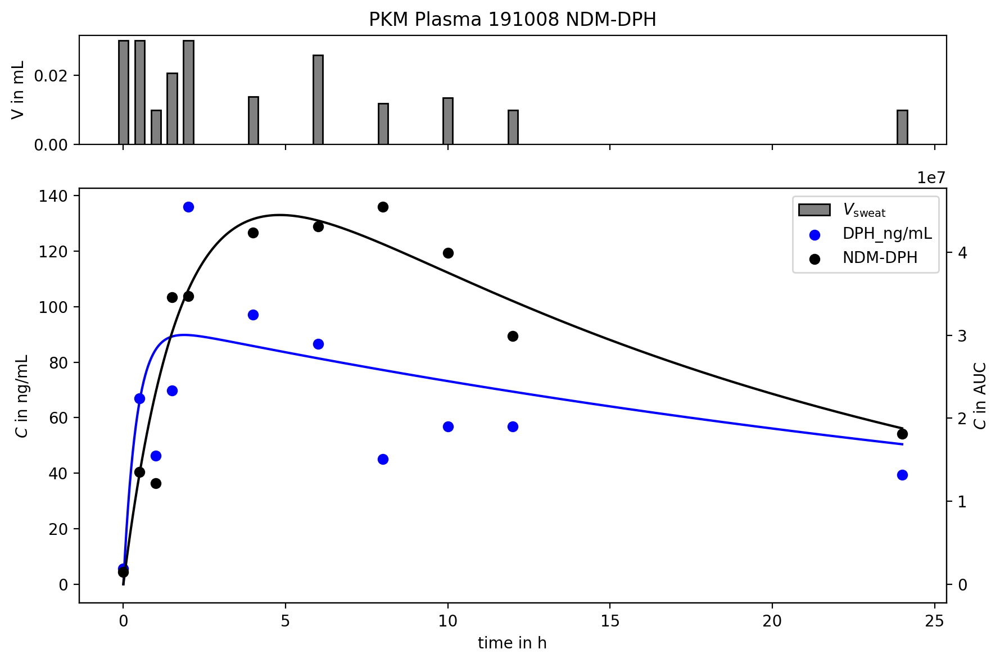

100%|██████████| 100/100 [00:00<00:00, 481.94it/s]


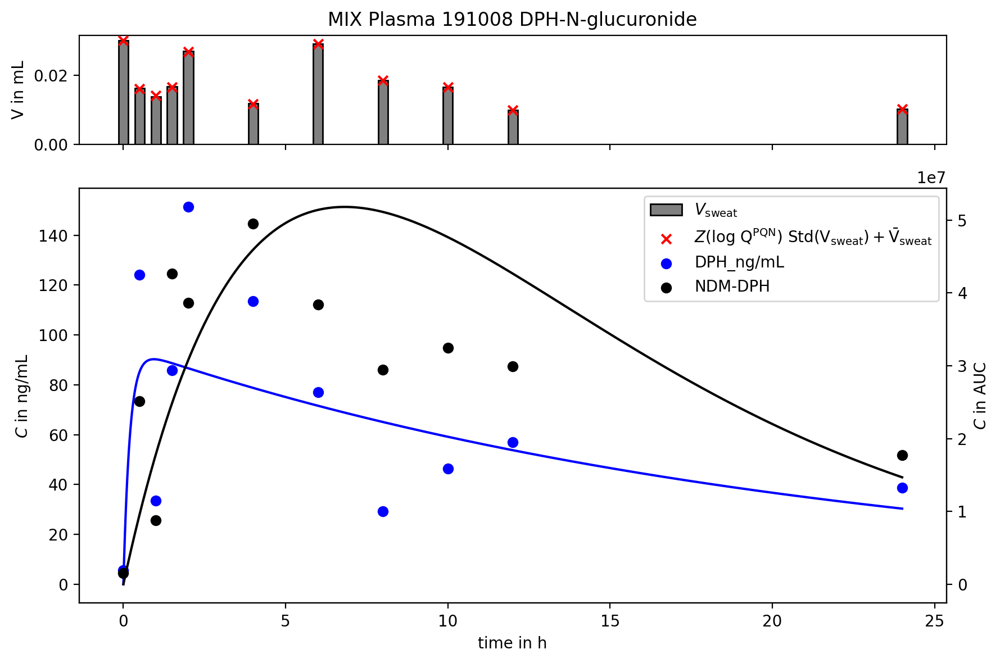

100%|██████████| 100/100 [00:00<00:00, 461.12it/s]


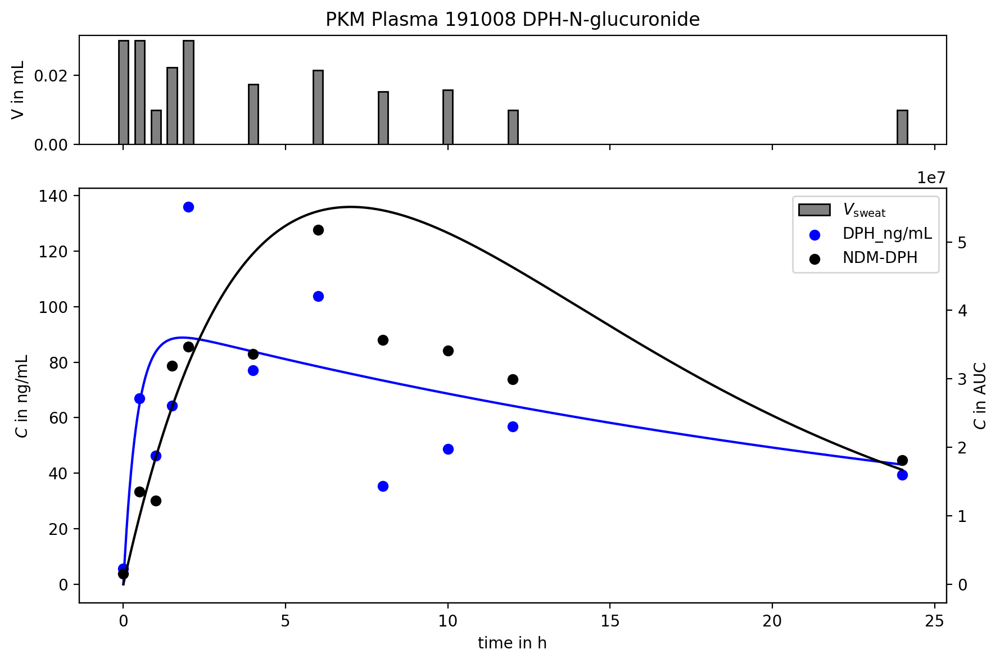

100%|██████████| 100/100 [00:00<00:00, 396.75it/s]


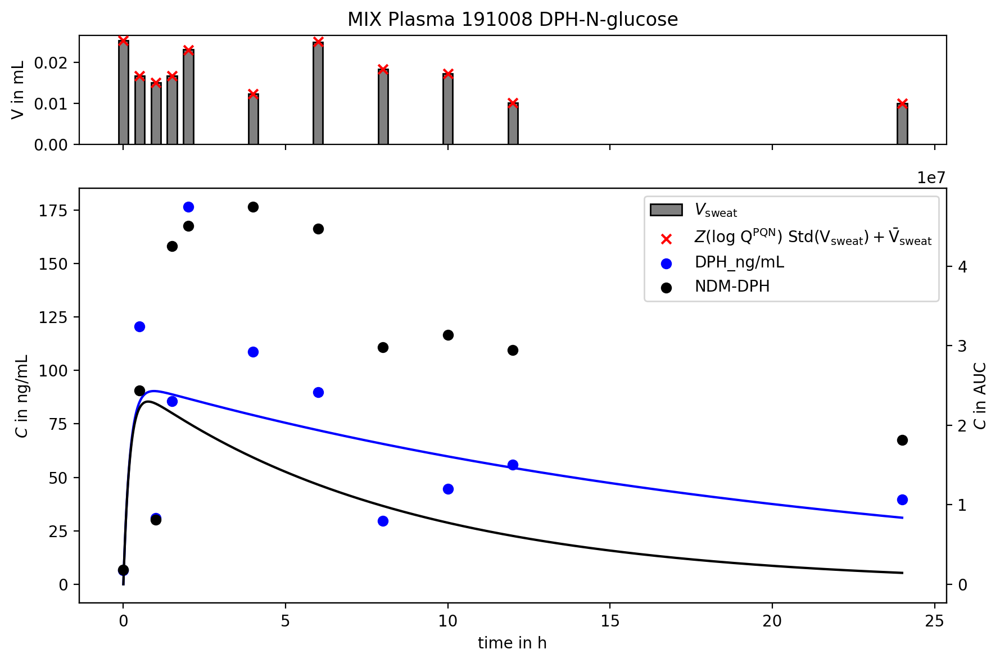

100%|██████████| 100/100 [00:00<00:00, 1010.60it/s]


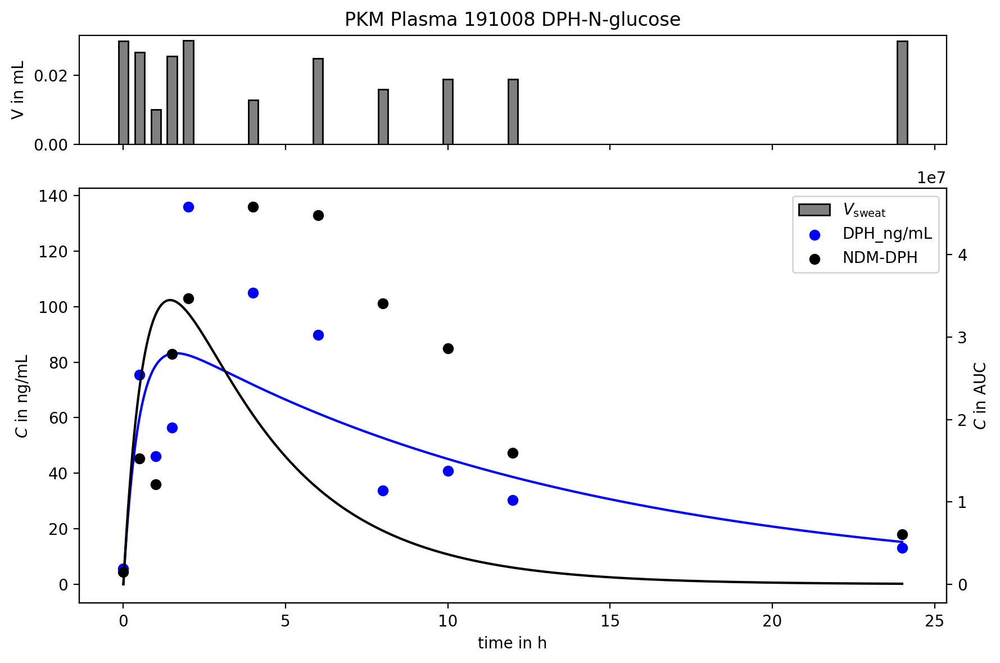

100%|██████████| 100/100 [00:00<00:00, 148.61it/s]


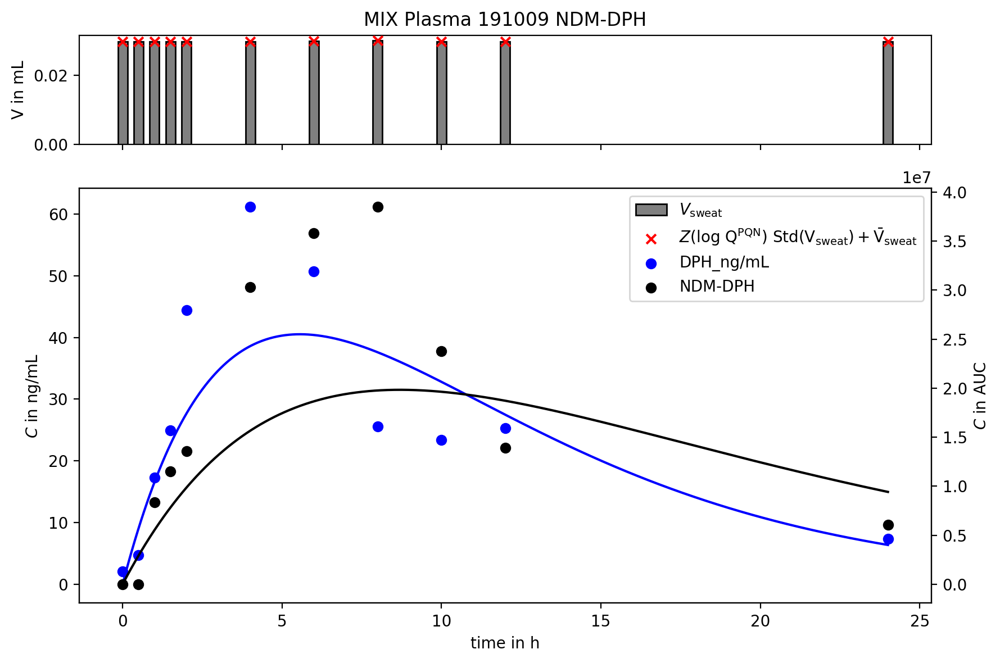

100%|██████████| 100/100 [00:00<00:00, 530.08it/s]


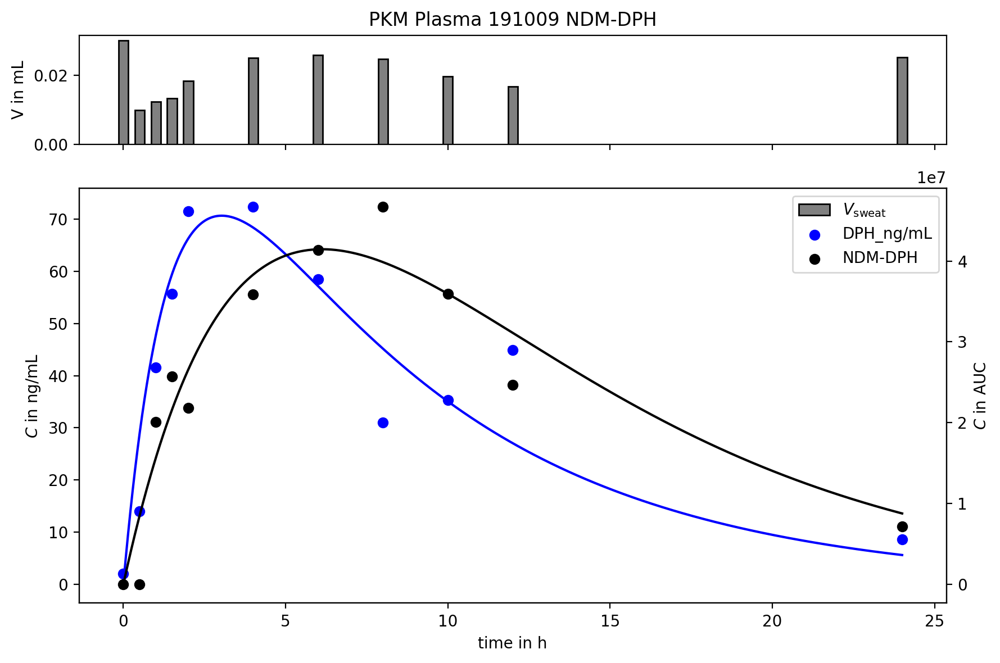

100%|██████████| 100/100 [00:00<00:00, 535.21it/s]


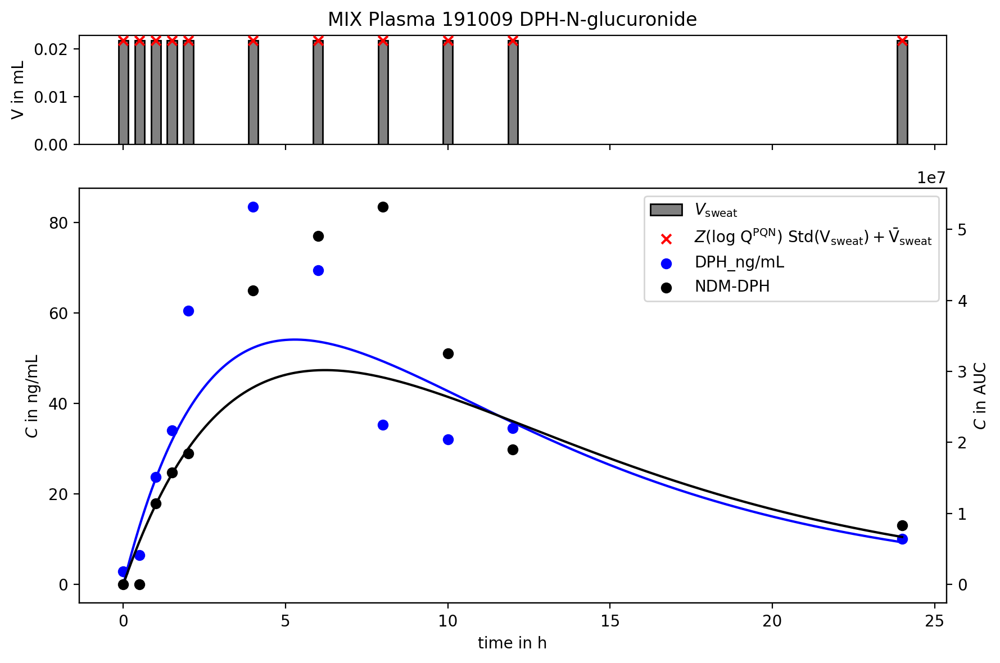

100%|██████████| 100/100 [00:00<00:00, 728.33it/s]


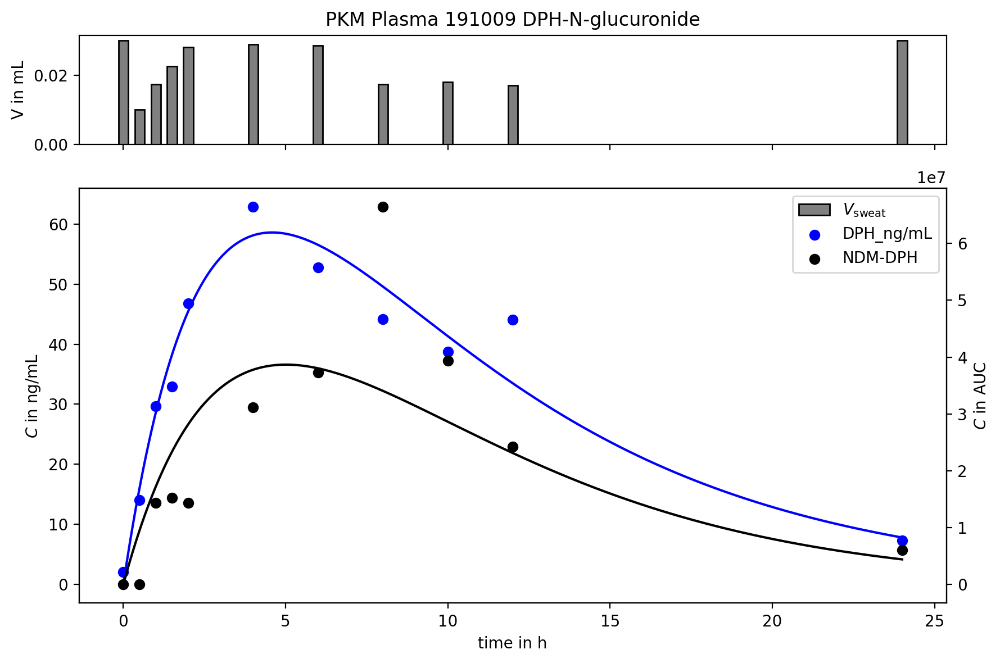

100%|██████████| 100/100 [00:00<00:00, 413.78it/s]


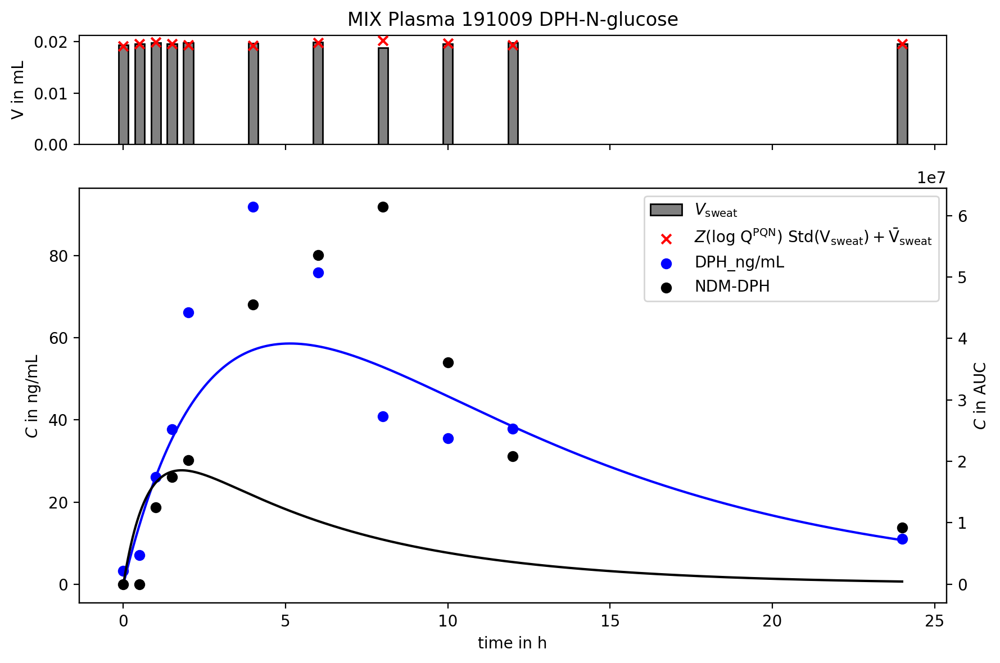

100%|██████████| 100/100 [00:00<00:00, 649.09it/s]


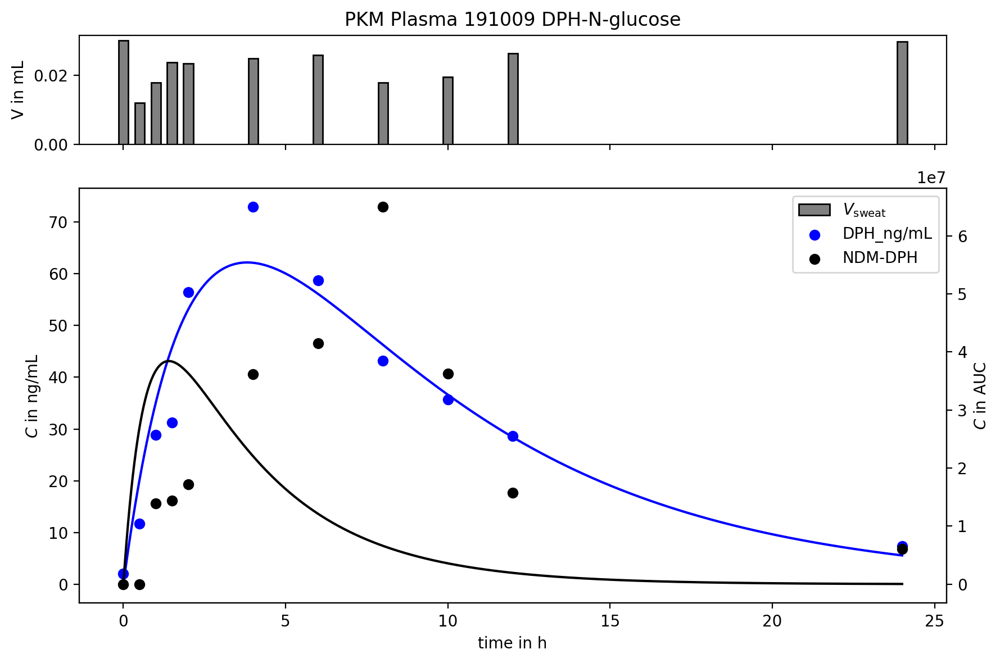

100%|██████████| 100/100 [00:00<00:00, 510.32it/s]


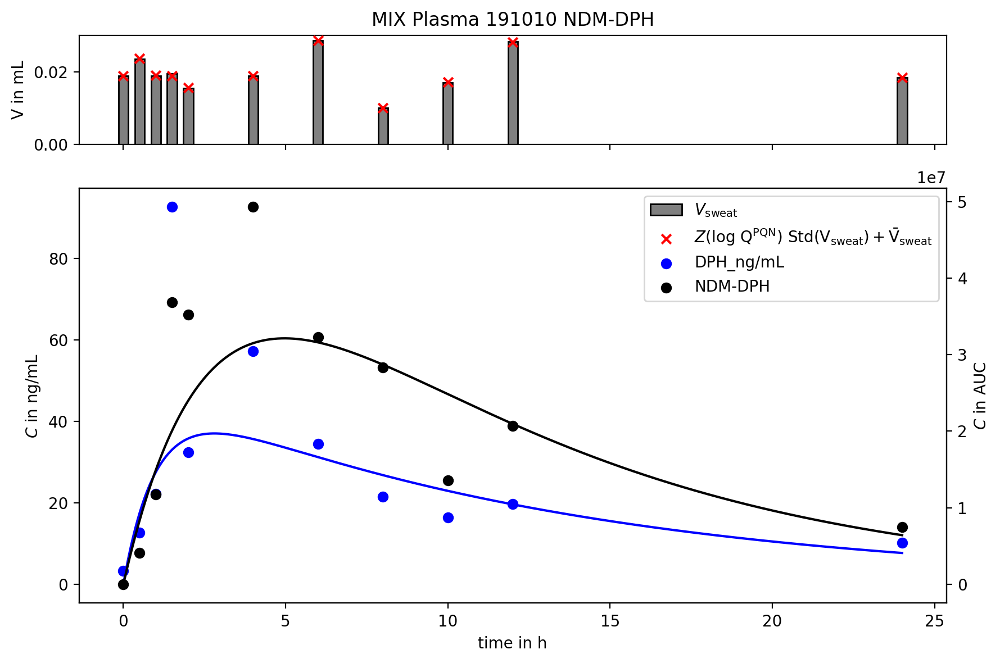

100%|██████████| 100/100 [00:00<00:00, 652.41it/s]


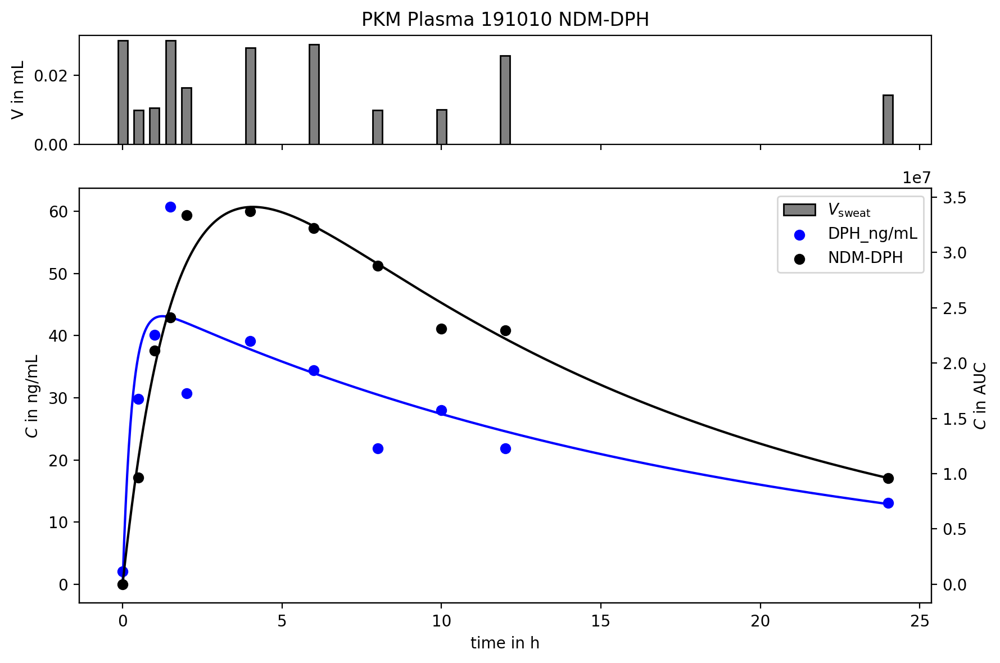

100%|██████████| 100/100 [00:00<00:00, 135.84it/s]


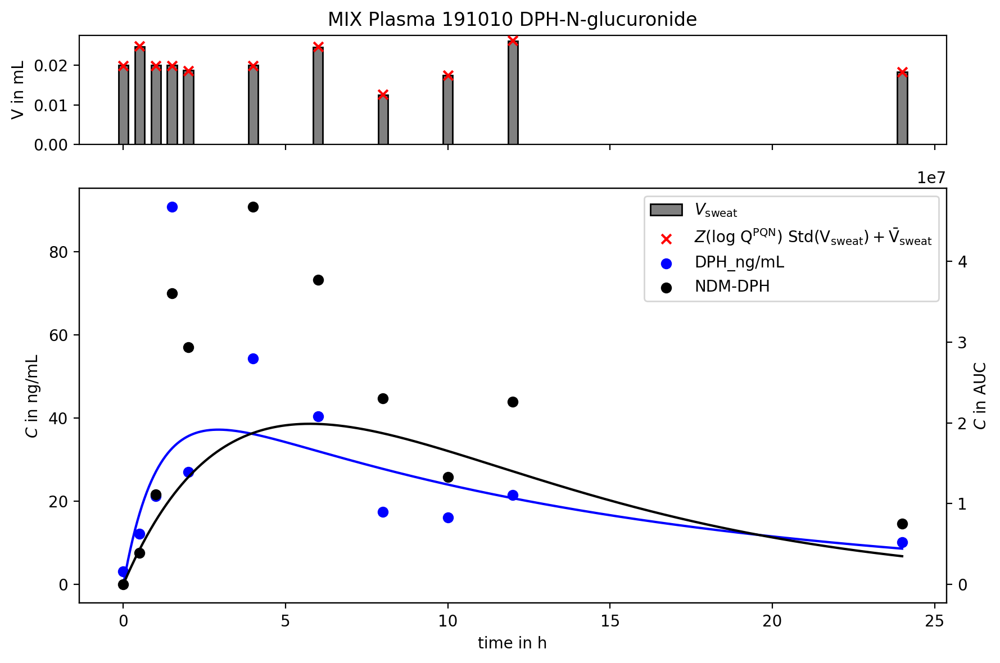

100%|██████████| 100/100 [00:00<00:00, 643.30it/s]


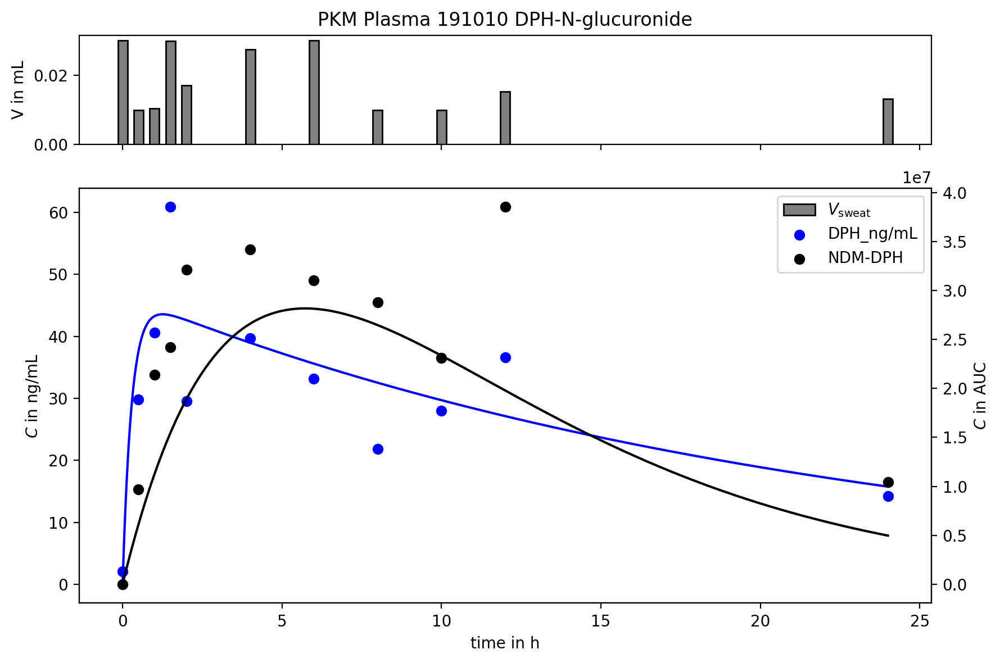

100%|██████████| 100/100 [00:01<00:00, 88.79it/s]


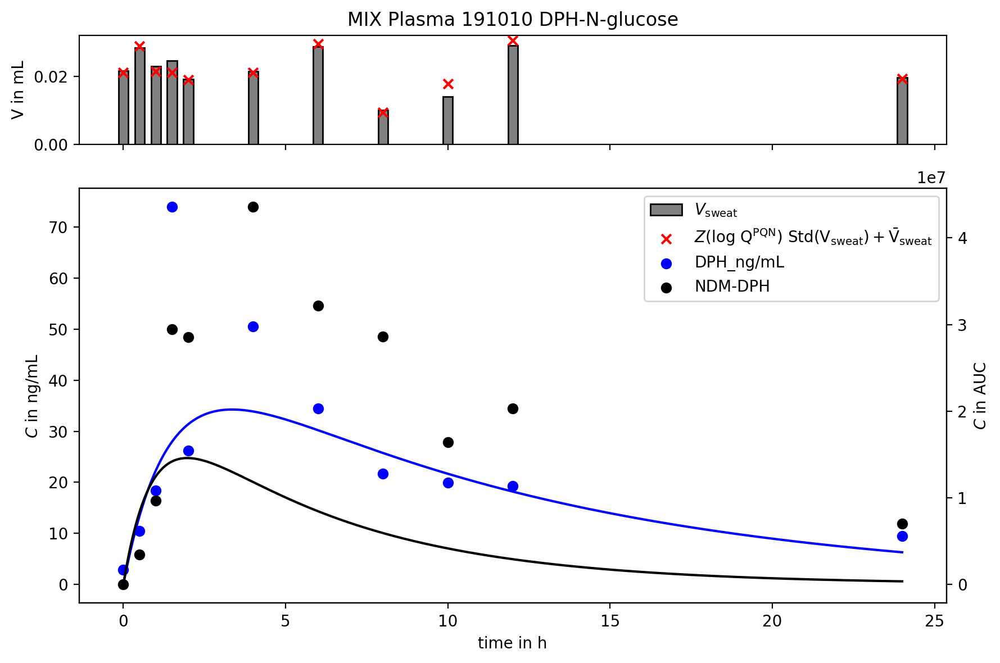

100%|██████████| 100/100 [00:00<00:00, 1008.40it/s]


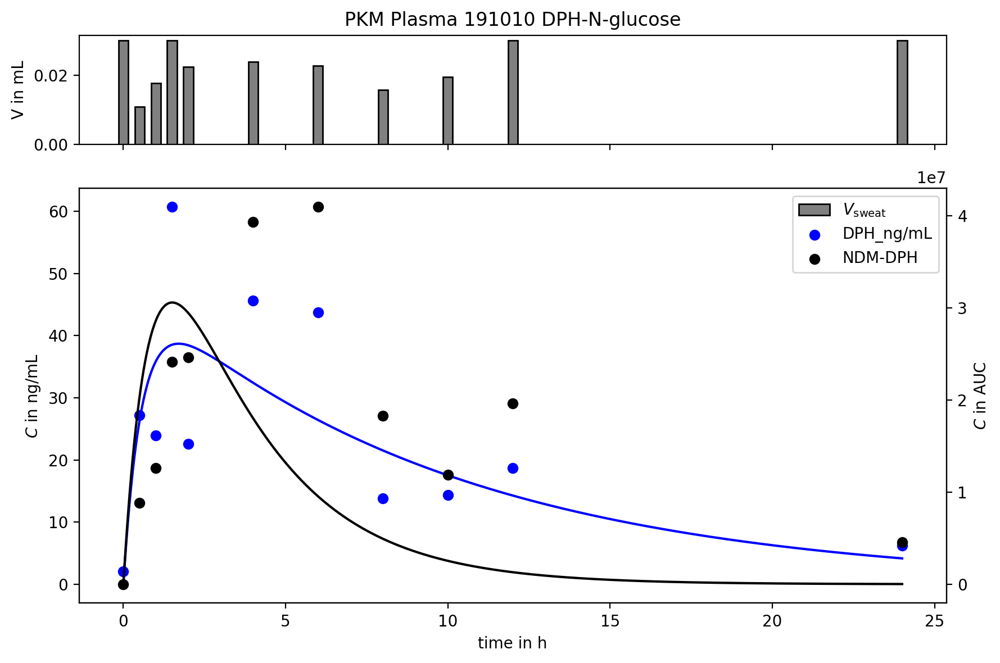

100%|██████████| 100/100 [00:00<00:00, 484.80it/s]


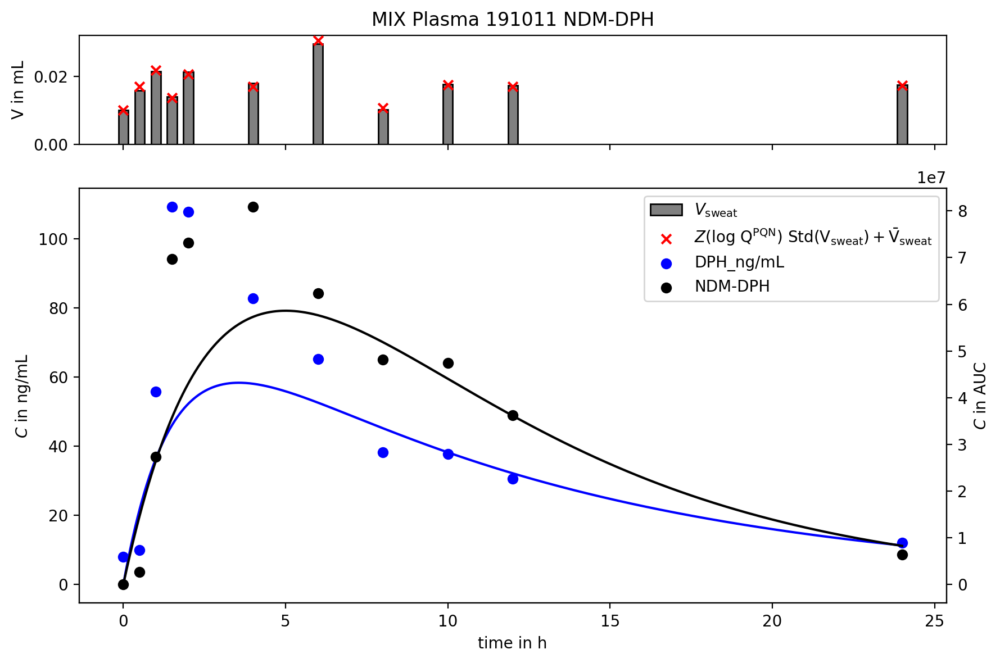

100%|██████████| 100/100 [00:00<00:00, 304.22it/s]


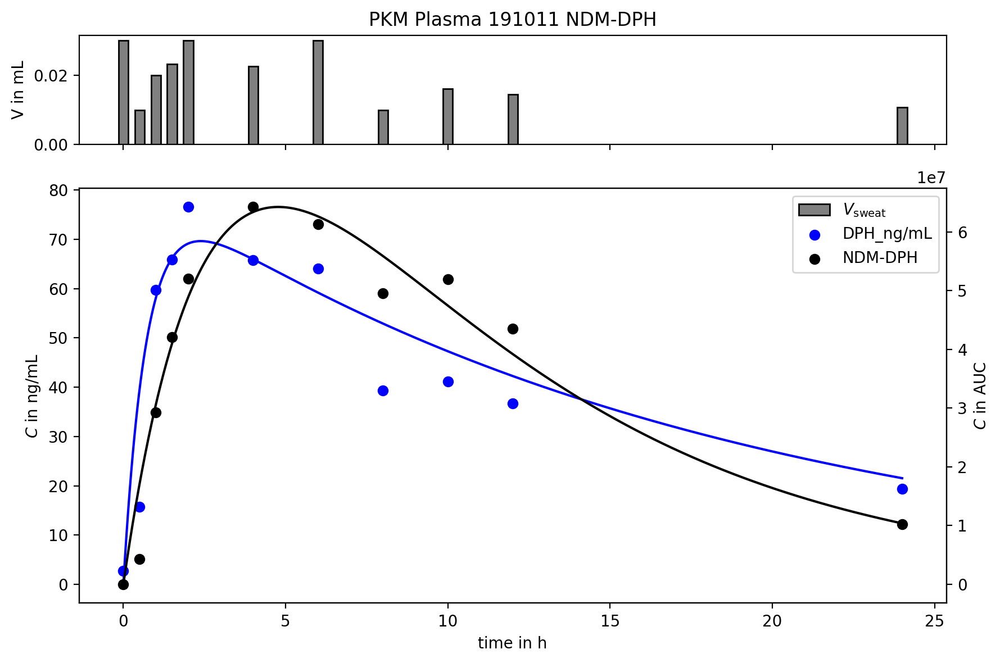

100%|██████████| 100/100 [00:00<00:00, 580.15it/s]


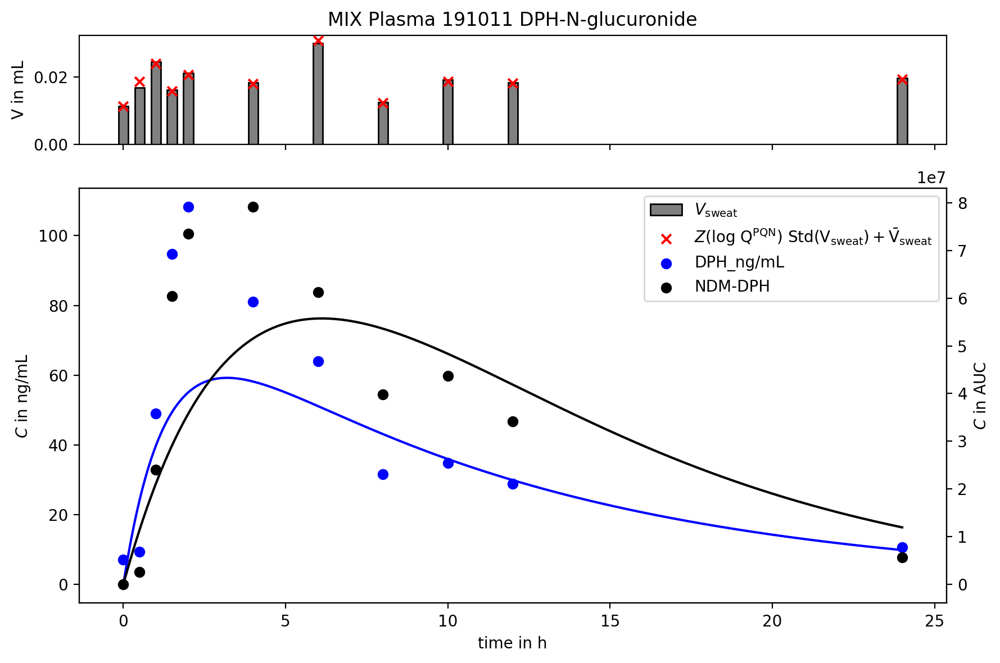

100%|██████████| 100/100 [00:00<00:00, 780.86it/s]


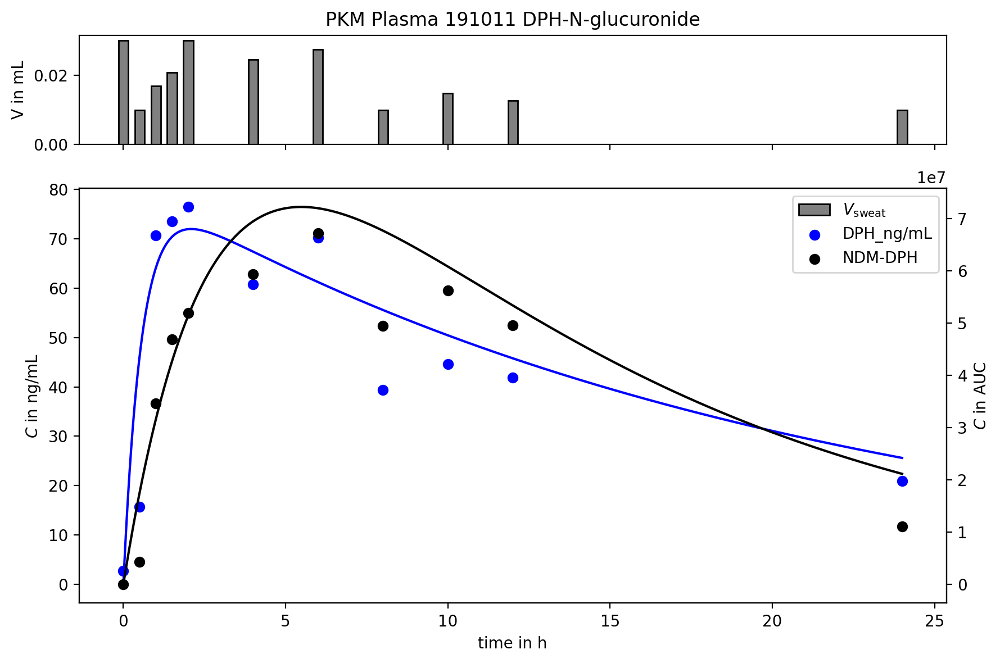

100%|██████████| 100/100 [00:00<00:00, 519.06it/s]


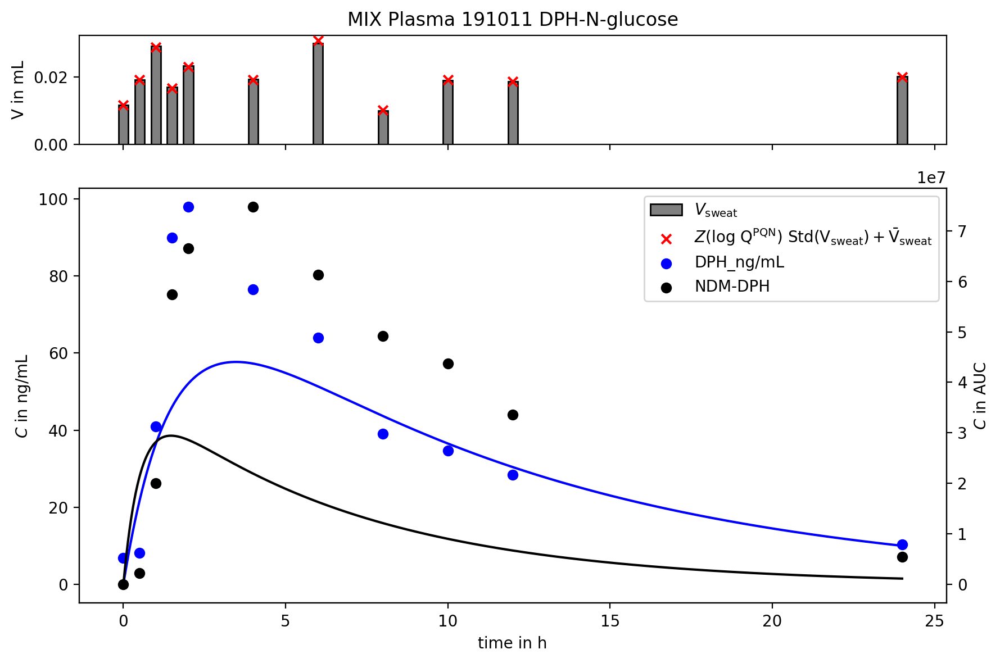

100%|██████████| 100/100 [00:00<00:00, 920.55it/s]


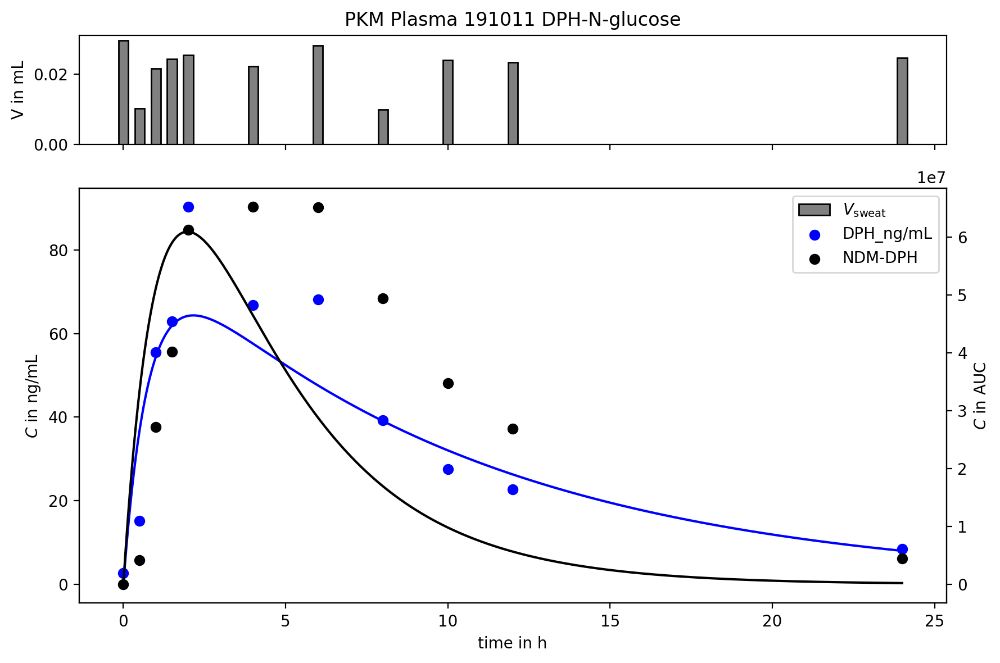

In [9]:
donors = ['191003', '191004', '191001', '191002', '191007', '191005', '191008', '191009', '191010', '191011']
metabolites = ['DPH_ng/mL','NDM-DPH','DPH-N-glucuronide','DPH-N-glucose']
# optimization precision
p = 1e-8

# here we use the preprocessed data where we renamed the DPH metabolites 
# and deleted all features where min(AUC(feature)) in samples < 5*max(AUC(feature)) in blanks
# features were identified according to their reported RT and MZ
# see Preprocessing.ipynb for details

sep_dic = {}
for donor in sorted(donors):
# for donor in ['191008']:
    sep_dic[donor] = {}
    ## DATA PROCESSING
    tmp = pd.read_csv(f'data/{donor}_plasma.csv',index_col=0)
    calibrated = lin(tmp['DPH'].values,*p_cal) * 3 * 0.05 # this factors are due to sample preparation (see Pantichpakdi et al. 2021 for details)
    tmp.insert(5,'DPH_ng/mL',calibrated)
    
    # Calculate c0 from D and V/f (see Pantichpakdi et al. 2021 for details)
    # D = 50         # mg
    # c0 = D*f/V     # ng/mL
    D = 50*1e6       # ng
    # V/f            # L
    # c0 = D/(V/f*1e3) # mL
    c0 = D/(paper_values.loc[donor,'V/f_L']*1e3)

    # scale M_tilde values
    factor_dic = {}
    for i in metabolites:
        factor_dic[i] = np.max(tmp.loc[:,i])
        tmp.loc[:,i] = tmp.loc[:,i]/factor_dic[i]
     
    # randomize the features to calculate PQN
    m_list = np.arange(tmp.iloc[:,11:].shape[1])+11
    np.random.shuffle(m_list)
    split_lists = np.array_split(m_list,3)
    for i in range(3):
        ## RAW DATA
        x_values = tmp['timepoint_hour'].values
        y_values = tmp.loc[:,[metabolites[0],metabolites[i+1]]].values.flatten()
        tmp_pqn_tensor = tmp.iloc[:,split_lists[i]].values.T
        pqn_data = calculate_pqn(tmp_pqn_tensor)
        n_meta = 2

        ## BUILDING MIX_mini Model
        mix_model = em.MIX_model(x_values,n_meta,scale_fun='standard',trans_fun='log10',pkm_fun='bateman')
        mix_model.set_measured_data(y_values,pqn_data)
        mix_model.set_metabolite_names([metabolites[0],metabolites[i+1]])
        
        ## CREATING BOUNDS
        sv_lb = .01    # in mL
        sv_ub = .03    # in mL
        lb = np.concatenate([[ 0,0,0  ,0,0]*n_meta,np.ones(mix_model.n_timepoints)*sv_lb])
        ub = np.concatenate([[ 5,1,300,p,p]*n_meta,np.ones(mix_model.n_timepoints)*sv_ub])
        lb[2] = c0/factor_dic['DPH_ng/mL']
        ub[2] = c0/factor_dic['DPH_ng/mL']+p
        mix_model.set_fit_bounds(lb,ub)

        ## OPTIMIZE MODEL
        mix_model.set_loss_function('cauchy_loss')
        lambda_ = 1/(n_meta+1)
        s_values = np.ones(mix_model.measured_data.shape)
        s_values[:mix_model.n_metabolites*mix_model.n_timepoints] = 1/lambda_
        s_values[mix_model.n_metabolites*mix_model.n_timepoints:] = 1/(1-lambda_)
        mix_model.set_sigma(s_values)
        out = mix_model.optimize_monte_carlo(100,100)

        ## PLOT MODEL
        plot(mix_model,tmp,f'MIX Plasma {donor} {metabolites[i+1]}',factor_dic)

        ## BUILDING PKM_mini MODEL
        pkm_model = em.PKM_model(x_values,n_meta,pkm_fun='bateman',trans_fun='none')
        pkm_model.set_measured_data(y_values)
        # setting model parameters
        pkm_model.set_fit_bounds(lb,ub)
        pkm_model.set_loss_function('max_cauchy_loss')
        s_values = np.ones(pkm_model.measured_data.shape)
        s_values[:pkm_model.n_metabolites*pkm_model.n_timepoints] = 1/lambda_
        s_values[pkm_model.n_metabolites*pkm_model.n_timepoints:] = 1/(1-lambda_)
        pkm_model.set_sigma(s_values)
        out = pkm_model.optimize_monte_carlo(100,100)
        sep_dic[donor][metabolites[i+1]] = [mix_model,pkm_model,factor_dic]
        
        ## PLOT MODEL
        plot(pkm_model,tmp,f'PKM Plasma {donor} {metabolites[i+1]}',factor_dic)
#         break
#     break

In [10]:
# pickle results
with open(f'Sub_2_plasma.pkl','wb') as file:
    pickle.dump(sep_dic,file)

## Plot Average C of DPH

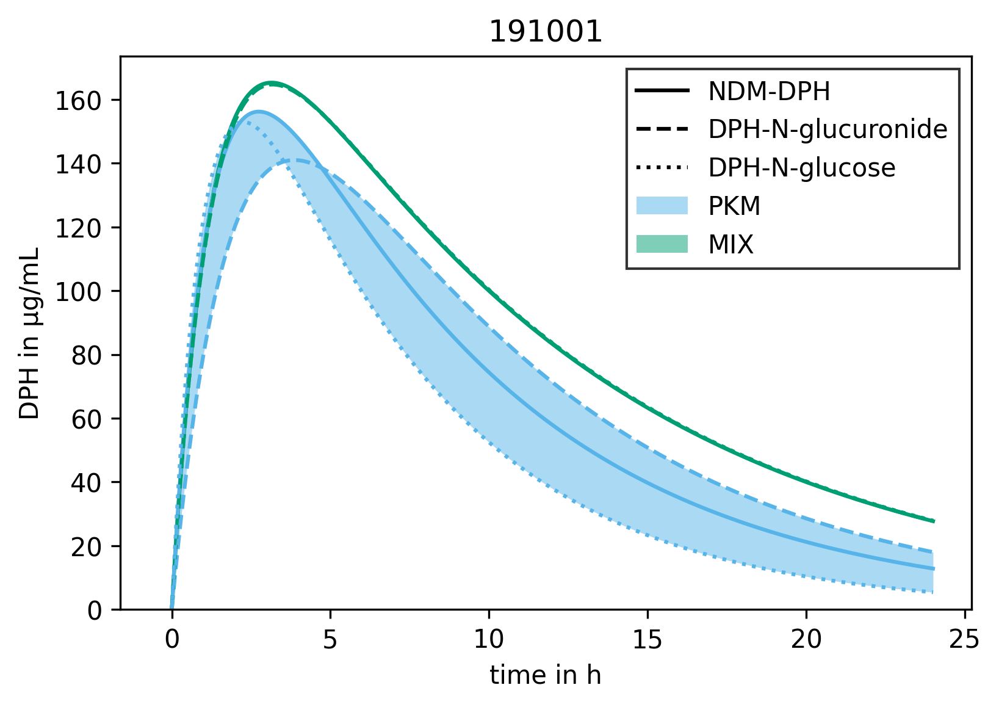

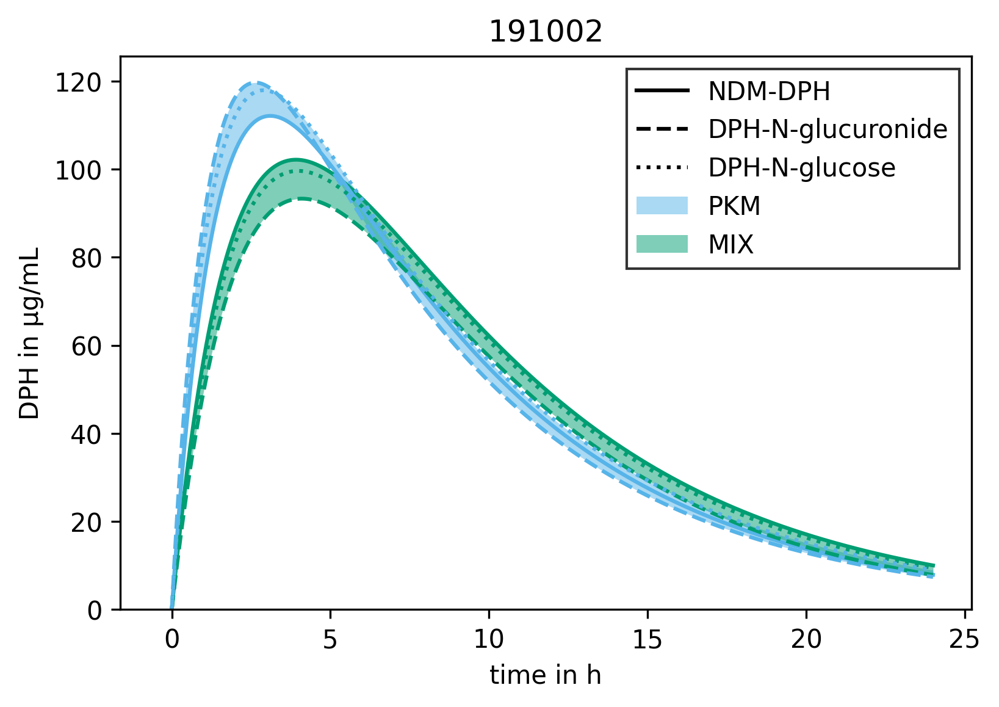

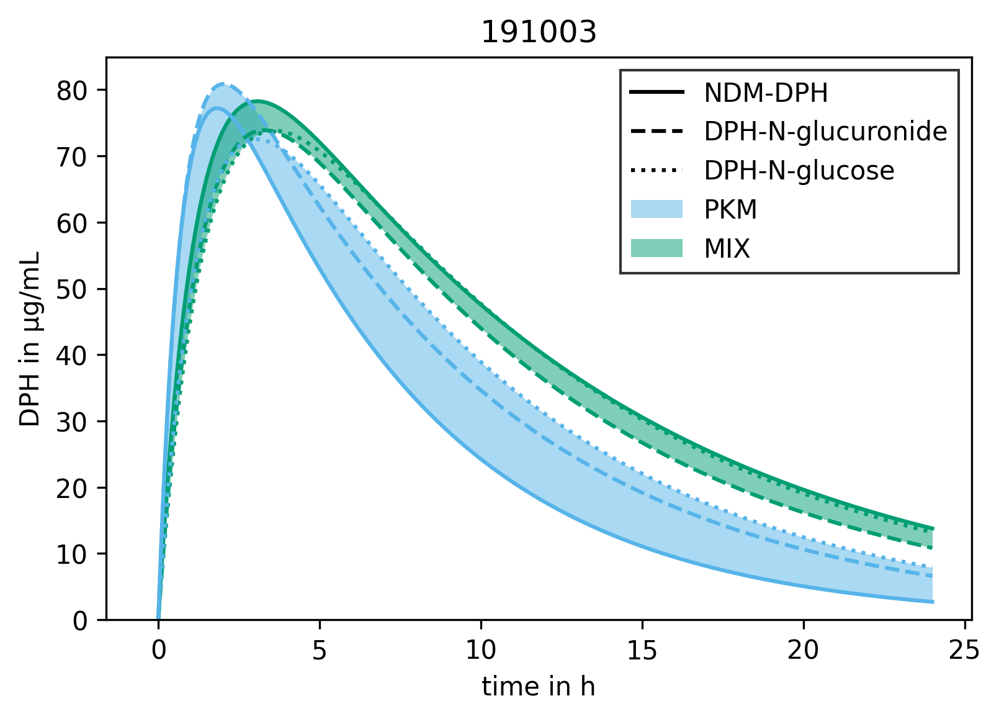

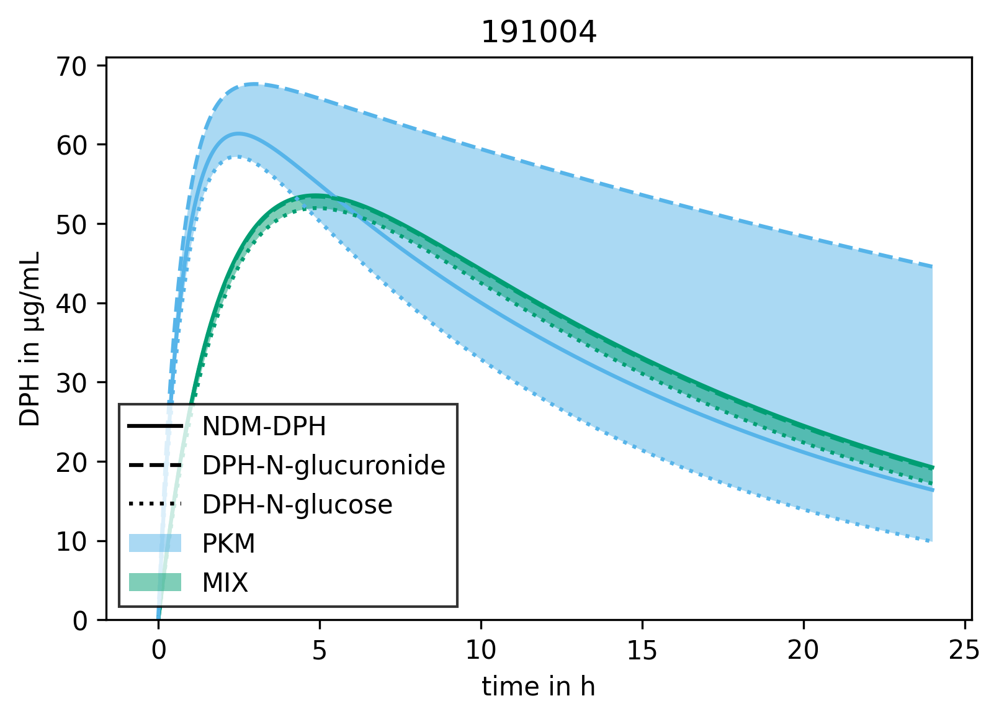

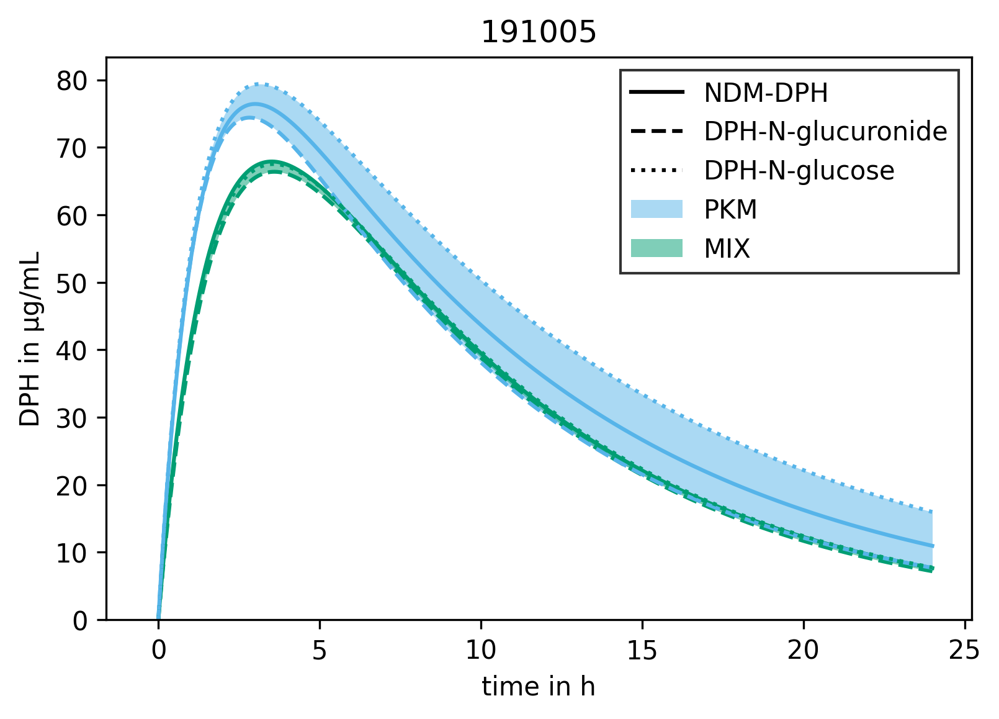

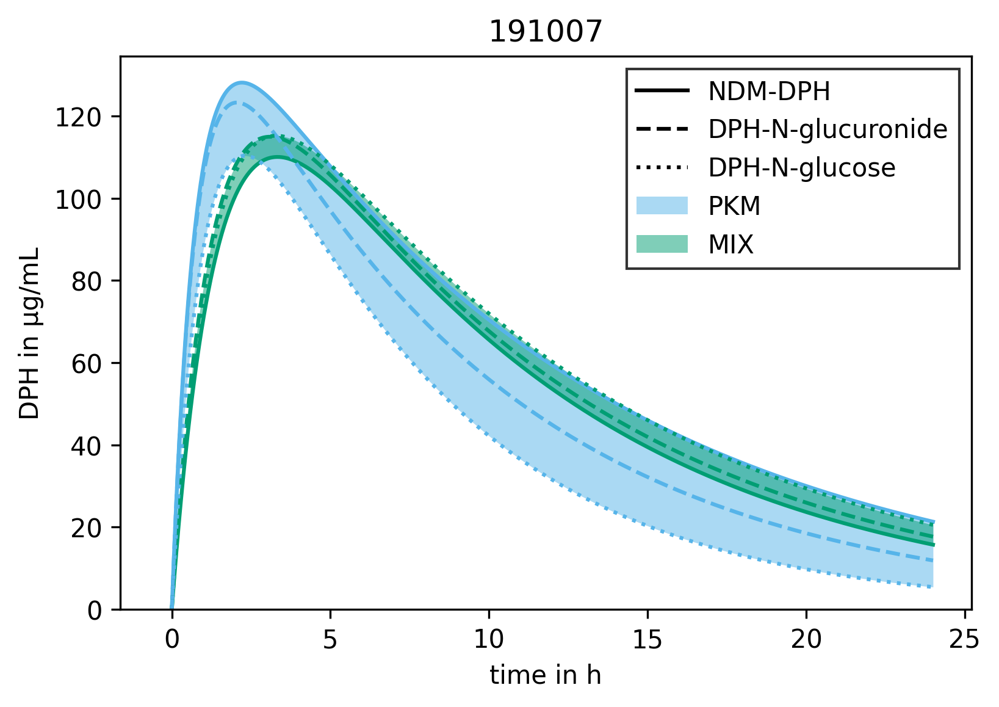

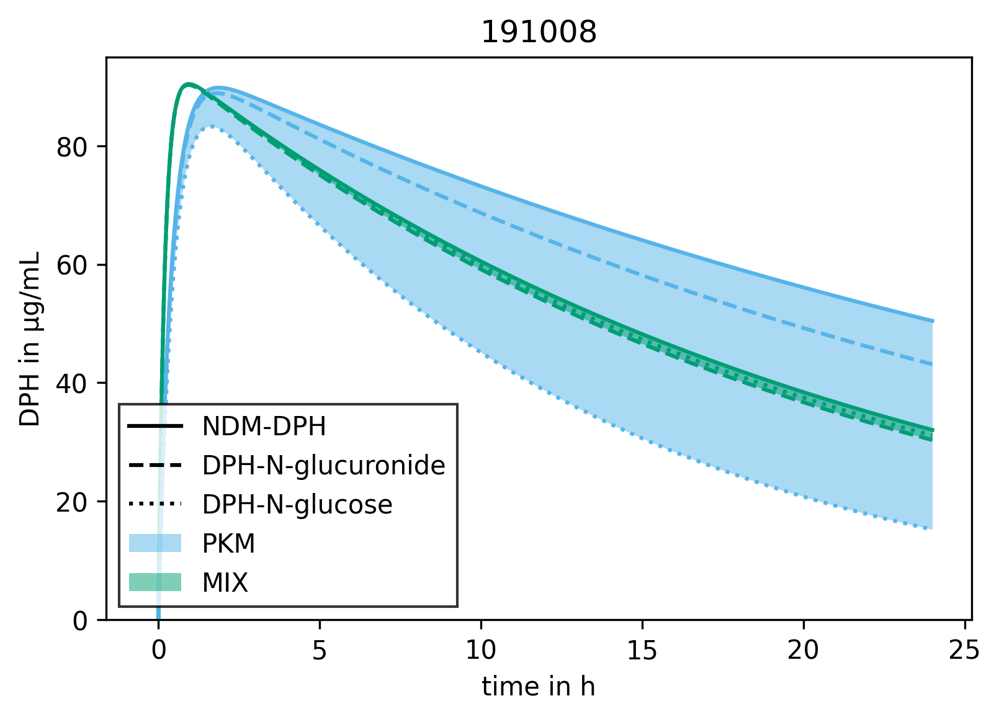

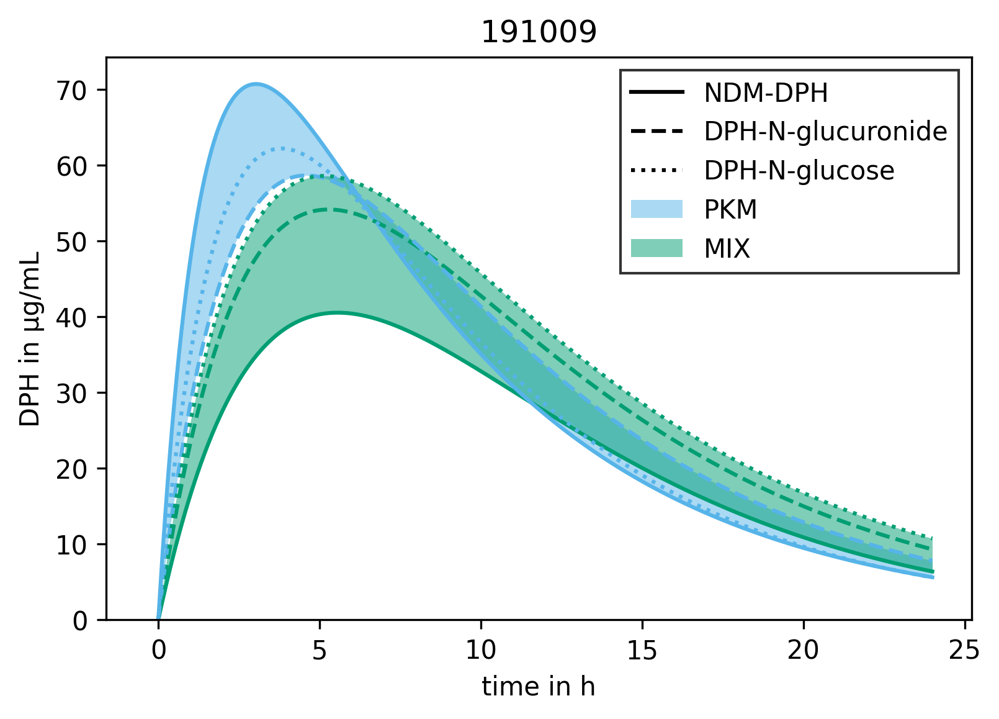

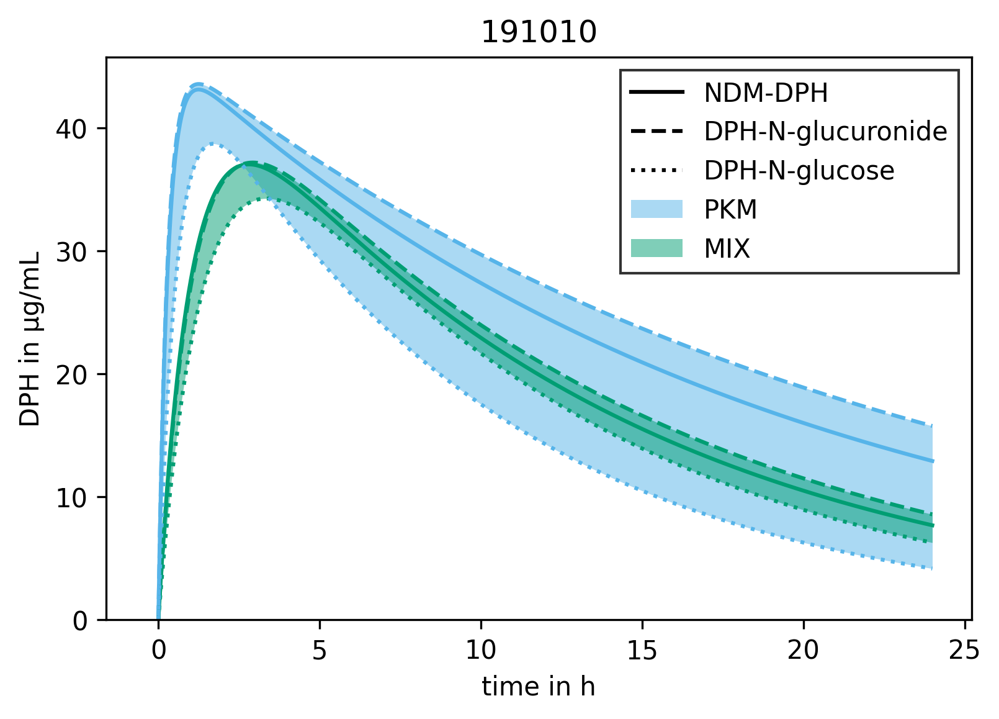

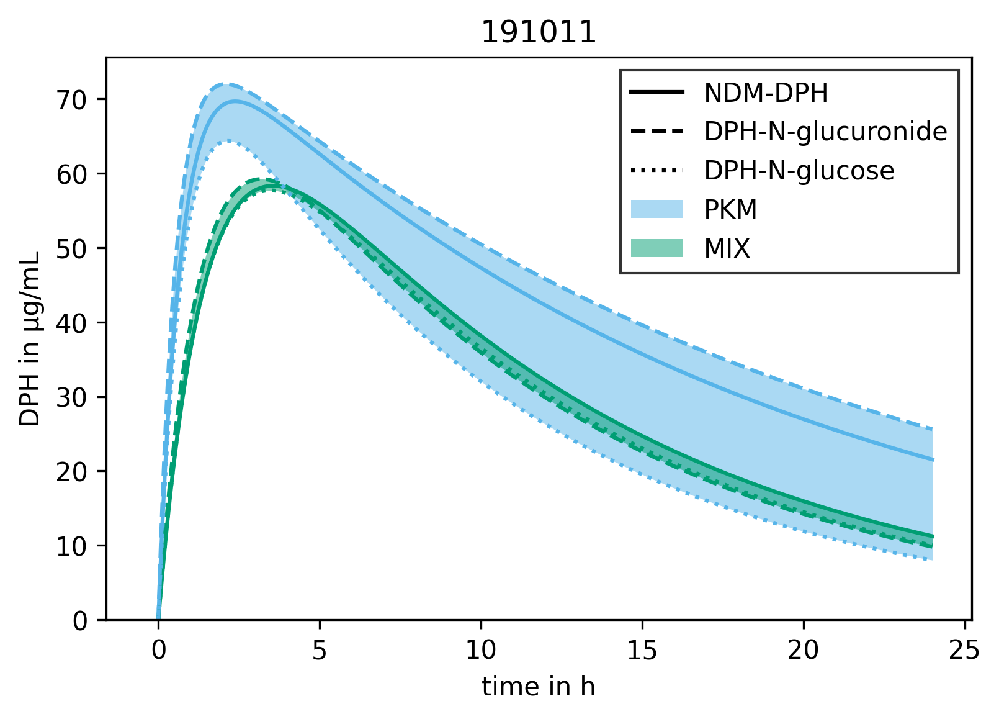

In [11]:
colors  = ['#56B4E9','#009E73']
styles = {'NDM-DPH':'-','DPH-N-glucuronide':'--','DPH-N-glucose':':'}
# 'NDM-DPH','DPH-N-glucuronide','DPH-N-glucose']
syn_x = np.linspace(0,24,1000)
mix_stds = []
pkm_stds = []
mix_sv_stds = []
pkm_sv_stds = []
for donor in sep_dic:
    plt.figure(dpi=300)
    plt.title(donor)
    mix_curves = []
    pkm_curves = []
    mix_ks = []
    pkm_ks = []
    mix_sv = []
    pkm_sv = []
    for metabolite in sep_dic[donor]:
        tmp_mix, tmp_pkm, tmp_factors = sep_dic[donor][metabolite]
        mix_y = tmp_mix.get_C_tensor(syn_x,tmp_mix.parameters)[0]*tmp_factors['DPH_ng/mL']
        pkm_y = tmp_pkm.plot(syn_x,*tmp_pkm.parameters)[0::2]*tmp_factors['DPH_ng/mL']
        plt.plot(syn_x,mix_y,color=colors[1],linestyle=styles[metabolite])
        plt.plot(syn_x,pkm_y,color=colors[0],linestyle=styles[metabolite])
        mix_curves.append(mix_y)
        pkm_curves.append(pkm_y)
        mix_ks.append(tmp_mix.get_kinetic_parameters()[:3])
        pkm_ks.append(tmp_pkm.get_kinetic_parameters()[:3])
        mix_sv.append(tmp_mix.get_sweat_volumes())
        pkm_sv.append(tmp_pkm.get_sweat_volumes())
#         break
    for curves,color in zip([pkm_curves,mix_curves],colors):
        min_ = []
        max_ = []
        for a,b,c in zip(curves[0],curves[1],curves[2]):
            min_.append(np.min([a,b,c]))
            max_.append(np.max([a,b,c]))
        area = plt.fill_between(syn_x,min_,max_,color=color,linewidth=0,alpha=.5)
    plt.bar(0,0,color=colors[0],label='PKM',alpha=.5)
    plt.bar(0,0,color=colors[1],label='MIX',alpha=.5)
    plt.plot(0,0,color='k',linestyle='-',label='NDM-DPH')
    plt.plot(0,0,color='k',linestyle='--',label='DPH-N-glucuronide')
    plt.plot(0,0,color='k',linestyle=':',label='DPH-N-glucose')
    plt.legend(fancybox=False,edgecolor='k')
    plt.ylabel('DPH in µg/mL')
    plt.xlabel('time in h')
    plt.show()
    
    mix_ks = np.array(mix_ks)
    pkm_ks = np.array(pkm_ks)
    tmp_mix_std = np.std(mix_ks,axis=0)/np.mean(mix_ks,axis=0)
    mix_stds.append(tmp_mix_std)
    tmp_pkm_std = np.std(pkm_ks,axis=0)/np.mean(pkm_ks,axis=0)
    pkm_stds.append(tmp_pkm_std)
    tmp_mix_sv = np.std(mix_sv,axis=0)/np.mean(mix_sv,axis=0)
    tmp_pkm_sv = np.std(pkm_sv,axis=0)/np.mean(pkm_sv,axis=0)
    mix_sv_stds.append(tmp_mix_sv)
    pkm_sv_stds.append(tmp_pkm_sv)
#     break

## Plot Standard Deviations

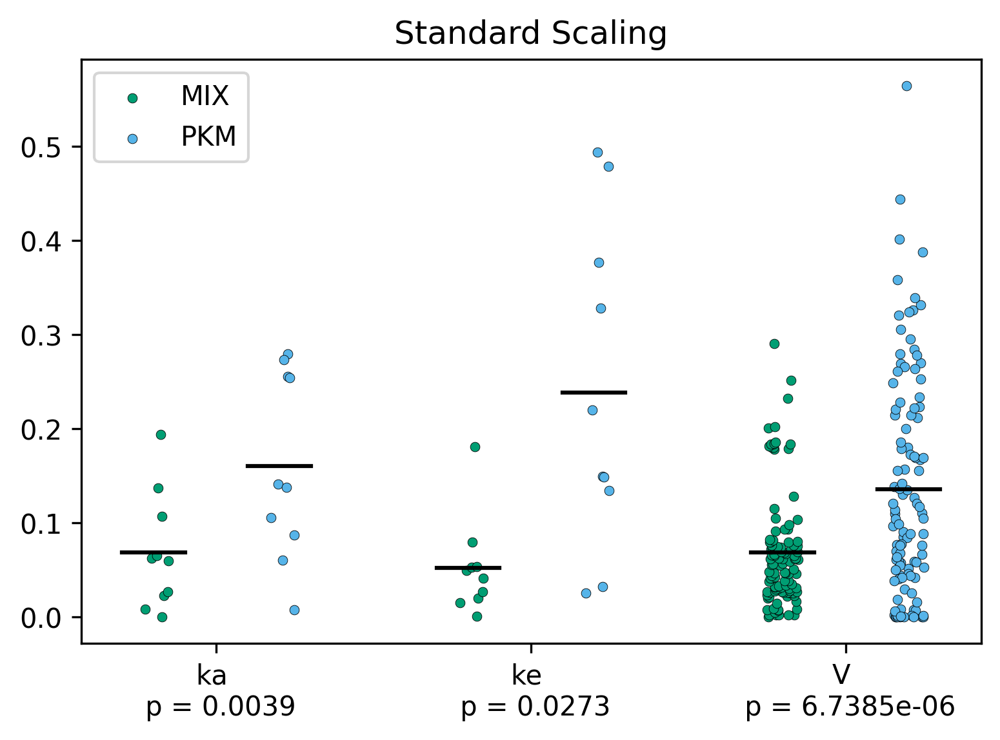

In [12]:
tmp_mix_stds = np.array(mix_stds)
tmp_pkm_stds = np.array(pkm_stds)
plt.figure(dpi=300)
plt.title('Standard Scaling')
np.random.seed(13)
offset = .05
variation = np.random.uniform(-offset,offset,tmp_mix_stds.shape[0])
# variation = np.linspace(-offset,offset,tmp_mix_stds.shape[0])
for i in range(2):
    tmp_mix_vals = sorted(tmp_mix_stds[:,i])
    tmp_pkm_vals = tmp_pkm_stds[:,i]
    l1 = plt.scatter(np.ones(tmp_mix_stds.shape[0])*(i+1)-.2+variation,tmp_mix_vals,color=colors[1],label='MIX',marker='.',s=50,edgecolor='k',linewidth=.2)
    l2 = plt.scatter(np.ones(tmp_mix_stds.shape[0])*(i+1)+.2+variation,tmp_pkm_vals,color=colors[0],label='PKM',marker='.',s=50,edgecolor='k',linewidth=.2)
    plt.plot([(i+1)-.2-.1,(i+1)-.2+.1],[np.mean(tmp_mix_vals),np.mean(tmp_mix_vals)],'k-')
    plt.plot([(i+1)+.2-.1,(i+1)+.2+.1],[np.mean(tmp_pkm_vals),np.mean(tmp_pkm_vals)],'k-')

ticklabs1 = ['ka \n p = {:.4f}'.format(ss.wilcoxon(tmp_pkm_stds[:,0].flatten(),tmp_mix_stds[:,0].flatten())[1]),'ke \n p = {:.4f}'.format(ss.wilcoxon(tmp_pkm_stds[:,1].flatten(),tmp_mix_stds[:,1].flatten())[1])]

tmp_mix_stds = np.concatenate(mix_sv_stds)
tmp_pkm_stds = np.concatenate(pkm_sv_stds)
variation = np.random.uniform(-offset,offset,tmp_mix_stds.shape[0])
# variation = np.linspace(-offset,offset,tmp_mix_stds.shape[0])
tmp_mix_vals = sorted(tmp_mix_stds[:])
tmp_pkm_vals = tmp_pkm_stds[:]
l1 = plt.scatter(np.ones(tmp_mix_stds.shape[0])*(i+2)-.2+variation,tmp_mix_vals,color=colors[1],label='MIX',marker='.',s=50,edgecolor='k',linewidth=.2)
l2 = plt.scatter(np.ones(tmp_mix_stds.shape[0])*(i+2)+.2+variation,tmp_pkm_vals,color=colors[0],label='PKM',marker='.',s=50,edgecolor='k',linewidth=.2)
plt.plot([(i+2)-.2-.1,(i+2)-.2+.1],[np.mean(tmp_mix_vals),np.mean(tmp_mix_vals)],'k-')
plt.plot([(i+2)+.2-.1,(i+2)+.2+.1],[np.mean(tmp_pkm_vals),np.mean(tmp_pkm_vals)],'k-')

lns = [l1,l2]
labs = [l.get_label() for l in lns]
# plt.title("Wilcoxon's p = {:.4f}".format(ss.wilcoxon(tmp_pkm_stds[:,:2].flatten(),tmp_mix_stds[:,:2].flatten())[1]))
plt.xticks([1,2,3],ticklabs1+['V \n p = {:.4e}'.format(ss.wilcoxon(tmp_pkm_stds,tmp_mix_stds)[1])])
plt.legend(lns, labs)
plt.show()